**Jacqueline Bumler, Leonardo Bocchi**

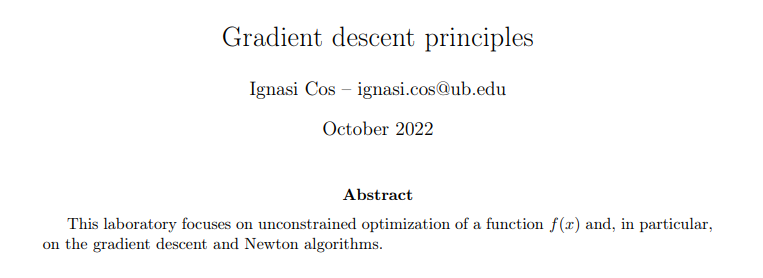

# **Ex.1 - Gradient descent methods | 1.1 - A simple quadratic function**

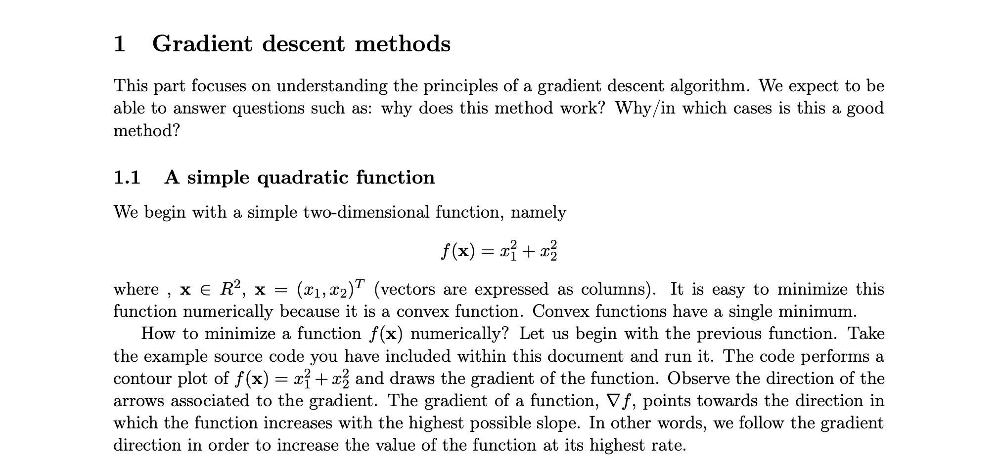

**Visualizing the function f(x)**

Text(0.5, 0, 'z')

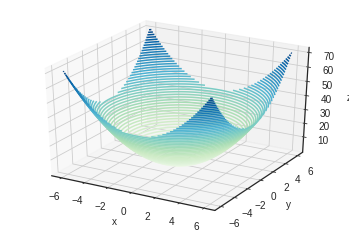

In [17]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('seaborn-white')

def f(x, y):
    return x ** 2 + y ** 2 

x = np.linspace(-6, 6, 30)
y = np.linspace(-6, 6, 30)

X, Y = np.meshgrid(x, y)
Z = f(X, Y)
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.contour3D(X, Y, Z, 50, cmap='GnBu')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')

**Visualizing the contour plot of the function f(x)**

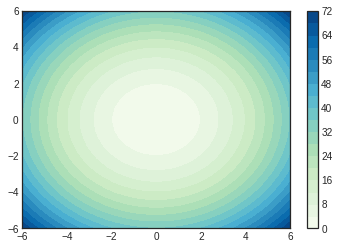

In [18]:
plt.contourf(X, Y, Z, 20, cmap='GnBu')
plt.colorbar();

**Visualizing the gradient map of the function f(x)**

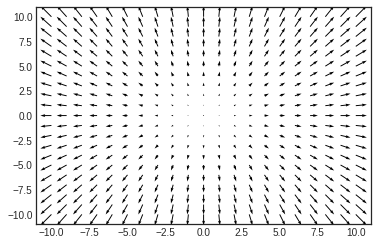

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import sympy

x,y=sympy.symbols('x y')
f=x**2+y**2

#symbolical gradient
gradf=[sympy.diff(f,var) for var in (x,y)]

#turn into a bivariate lambda for numpy
numgradf=sympy.lambdify([x,y],gradf)

X,Y=np.meshgrid(np.arange(-10,11),np.arange(-10,11))
graddat=numgradf(X,Y)

plt.figure()
plt.quiver(X,Y,graddat[0],graddat[1])
plt.show()

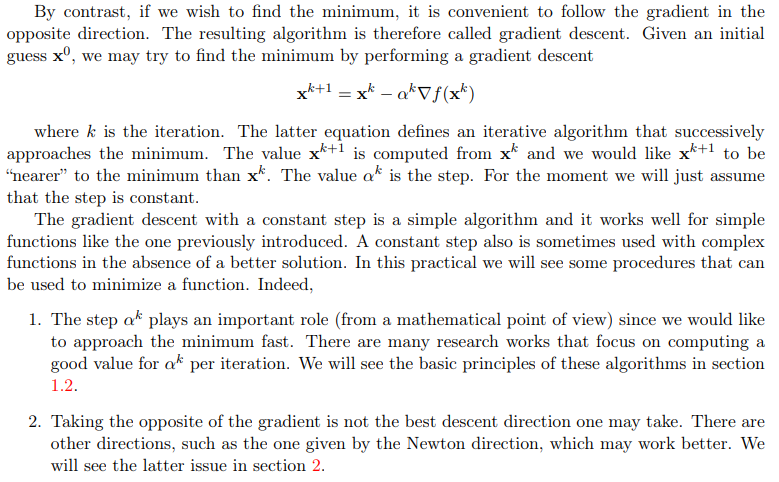

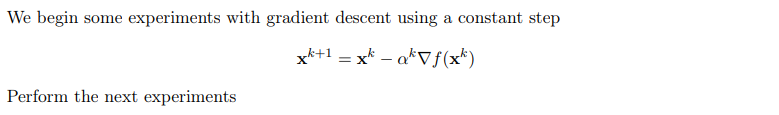

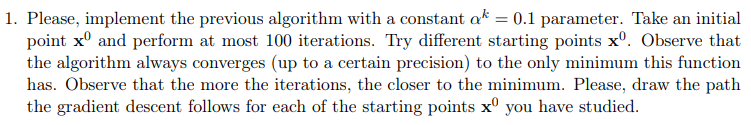

**Defining a gradient descent function with a constant step**

In [20]:
import numpy as np

def gradient_f(x):
  grad = np.zeros([2,1])
  grad[0] = 2*x[0]
  grad[1] = 2*x[1]
  return grad           # Returns a float column vector of 2x1 

def grad_des_ac(x0, alpha, n_iter):
  """ Gradient descent method
  Direction of descent: steepest, alpha: costant
  """

  xk = np.zeros([2,n_iter+1])
  xk[:,[0]] = x0
  for k in range(0, n_iter):
    grad = gradient_f(xk[:,[k]])
    xk[:,[k+1]] = xk[:,[k]] - alpha*grad

  return xk

**Generating some points x0 and plotting them on the contour plot of f(x)**

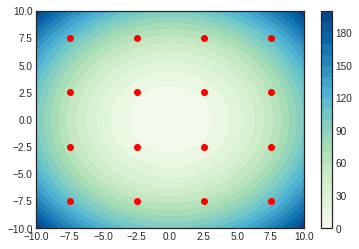

In [21]:
# Defining some parameters -----------------------------------------------------
alpha = 0.1
n_iter = 100

x1_zeros = np.linspace(-7.5, 7.5, 4)
x2_zeros = np.linspace(-7.5, 7.5, 4)
x_zeros = np.zeros([2, 4*4])        # making a 2x16 vector with the coordinates of some points to use as x0
for i in range(0,4):
  for j in range(0,4):
    x_zeros[0,i+j+i*3] = x1_zeros[i]
    x_zeros[1,i+j+i*3] = x2_zeros[j]

# Contourplot of the function --------------------------------------------------
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np

plt.style.use('seaborn-white')

def f(x, y):
    return x ** 2 + y ** 2 

x = np.linspace(-10, 10, 50)
y = np.linspace(-10, 10, 40)

X, Y = np.meshgrid(x, y)
Z = f(X, Y)

plt.contourf(X, Y, Z, 20, cmap='GnBu')
plt.colorbar();
plt.scatter(x_zeros[0], x_zeros[1], c='r')      # Plot of the chosen initial values x0

**Applying the gradient descent method to the different x0**

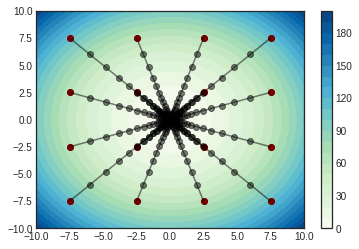

In [22]:
# Contourplot of the graph -----------------------------------------------------
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np

plt.style.use('seaborn-white')

def f(x, y):
    return x ** 2 + y ** 2 

x = np.linspace(-10, 10, 50)
y = np.linspace(-10, 10, 40)

X, Y = np.meshgrid(x, y)
Z = f(X, Y)

plt.contourf(X, Y, Z, 20, cmap='GnBu')
plt.colorbar();
plt.scatter(x_zeros[0], x_zeros[1], c='r')

# Running the method on the 16 chosen initial values of x0 ---------------------
alpha = 0.1
for i in range(0, 16):
  xk = grad_des_ac(x_zeros[:,[i]], alpha, n_iter)
  plt.plot(xk[0], xk[1], c='k', alpha=0.5)        # Plotting the path of the xk
  plt.scatter(xk[0], xk[1], c='k', alpha=0.5)     # Scattering points at each step k  

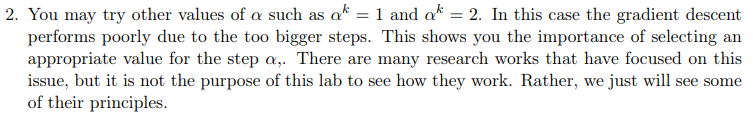

**Observe how the algorithm performs with a stepsize of alpha=1:**

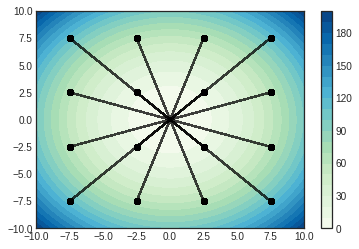

In [23]:
# Contourplot of the graph -----------------------------------------------------
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np

plt.style.use('seaborn-white')

def f(x, y):
    return x ** 2 + y ** 2 

x = np.linspace(-10, 10, 50)
y = np.linspace(-10, 10, 40)

X, Y = np.meshgrid(x, y)
Z = f(X, Y)

plt.contourf(X, Y, Z, 20, cmap='GnBu')
plt.colorbar();
plt.scatter(x_zeros[0], x_zeros[1], c='r')

# Running the method on the 16 chosen initial values of x0 ---------------------
alpha = 1
for i in range(0, 16):
  xk = grad_des_ac(x_zeros[:,[i]], alpha, n_iter)
  plt.plot(xk[0], xk[1], c='k', alpha=0.5)        # Plotting the path of the xk
  plt.scatter(xk[0], xk[1], c='k', alpha=0.5)     # Scattering points at each step k  

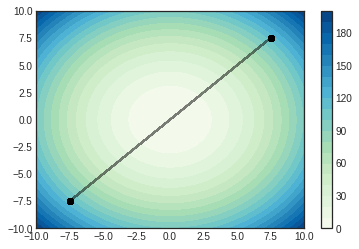

In [24]:
# Focussing on a particular initial value --------------------------------------
plt.contourf(X, Y, Z, 20, cmap='GnBu')
plt.colorbar();
plt.scatter(x_zeros[0,0], x_zeros[1,0], c='r')
xk = grad_des_ac(x_zeros[:,[0]], alpha, n_iter)
plt.plot(xk[0], xk[1], c='k', alpha=0.5)        # Plotting the path of the xk
plt.scatter(xk[0], xk[1], c='k', alpha=0.5)     # Scattering points at each step k  

**The output of the method shows how it does not converge to the solution, due to the fact of using a stepsize of alpha=1**

In [26]:
xk[:,-5:]     # Last iterations of the method

array([[-7.5,  7.5, -7.5,  7.5, -7.5],
       [-7.5,  7.5, -7.5,  7.5, -7.5]])

OBSERVATION: with alpha=1 the method oscillates between two values opposite respect to the minimum

**Observe how the algorithm performs with a stepsize of alpha=2:**

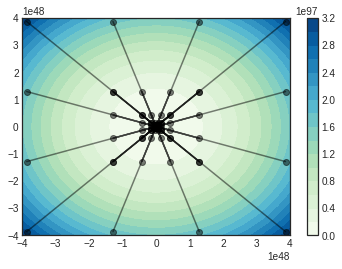

In [27]:
# Contourplot of the graph -----------------------------------------------------
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np

plt.style.use('seaborn-white')

def f(x, y):
    return x ** 2 + y ** 2 

x = np.linspace(-4e48, 4e48, 50)
y = np.linspace(-4e48, 4e48, 40)

X, Y = np.meshgrid(x, y)
Z = f(X, Y)

plt.contourf(X, Y, Z, 20, cmap='GnBu')
plt.colorbar();
plt.scatter(x_zeros[0], x_zeros[1], c='r')

# Running the method on the 16 chosen initial values of x0 ---------------------
alpha = 2
for i in range(0, 16):
  xk = grad_des_ac(x_zeros[:,[i]], alpha, n_iter)
  plt.plot(xk[0], xk[1], c='k', alpha=0.5)        # Plotting the path of the xk
  plt.scatter(xk[0], xk[1], c='k', alpha=0.5)     # Scattering points at each step k  

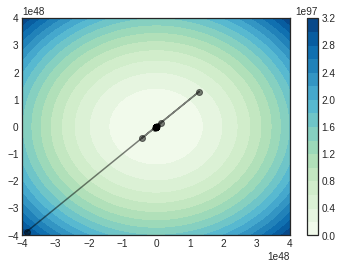

In [28]:
# Focussing on a particular initial value --------------------------------------
plt.contourf(X, Y, Z, 20, cmap='GnBu')
plt.colorbar();
plt.scatter(x_zeros[0,0], x_zeros[1,0], c='r')
xk = grad_des_ac(x_zeros[:,[0]], alpha, n_iter)
plt.plot(xk[0], xk[1], c='k', alpha=0.5)        # Plotting the path of the xk
plt.scatter(xk[0], xk[1], c='k', alpha=0.5)     # Scattering points at each step k  

**The output of the method shows how it diverges, due to the fact of using a stepsize of alpha=2 (way too large)**

In [29]:
xk[:,-5:]       # Last iterations of the method

array([[-4.77201408e+46,  1.43160422e+47, -4.29481267e+47,
         1.28844380e+48, -3.86533141e+48],
       [-4.77201408e+46,  1.43160422e+47, -4.29481267e+47,
         1.28844380e+48, -3.86533141e+48]])

OBSERVATION: with alpha=2 the method diverges from the minimum, the stepsize is too large

# **Ex.1 - Gradient descent methods | 1.2 A function with multiple minima** 

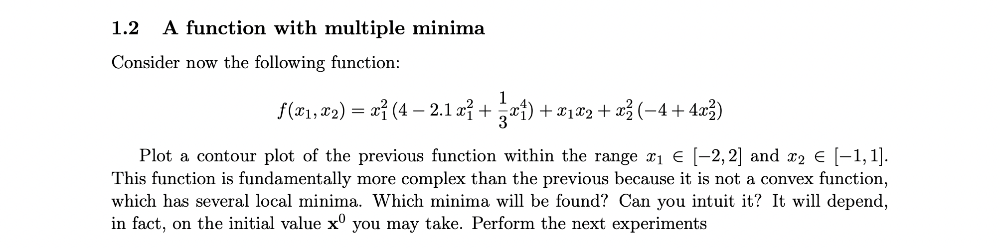

**Visualizing the contour plot of the function**

/usr/local/lib/python3.7/dist-packages/mpl_toolkits/mplot3d/art3d.py:304: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  self._segments3d = np.asanyarray(segments)


Text(0.5, 0, 'z')

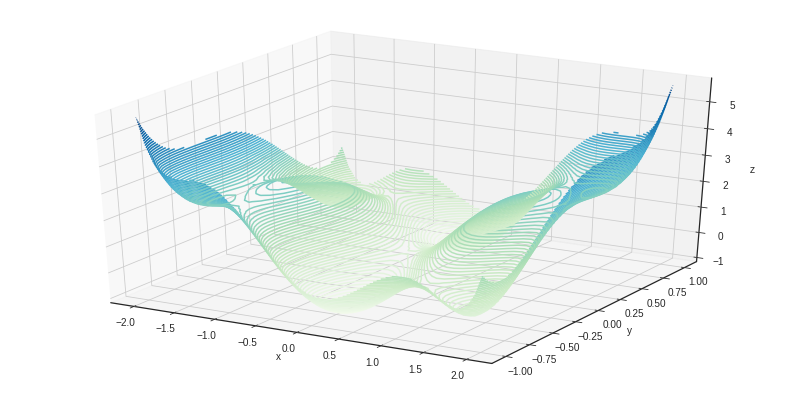

In [30]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('seaborn-white')

def f(x1, x2):
    return (x1**2)*(4-2.1*(x1**2)+1/3*(x1**4))+x1*x2+(x2**2)*(-4+4*(x2**2))

x1 = np.linspace(-2, 2, 50)
x2 = np.linspace(-1, 1, 40)

X1, X2 = np.meshgrid(x1, x2)
Z = f(X1, X2)

fig = plt.figure(figsize=(14, 7))
ax = plt.axes(projection='3d')
ax.contour3D(X1, X2, Z, 100, cmap='GnBu')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')

(-1.0, 1.0)

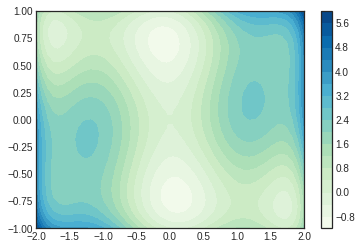

In [31]:
plt.contourf(X1, X2, Z, 20, cmap='GnBu')
plt.colorbar();
plt.xlim([-2,2])
plt.ylim([-1,1])

Based on the contour plot, it seems that some minima will not be found as easily as the others. The lightest white spots on our contour plot will be the minima that are most easily found using the gradient descent method as they have the smallest value of f(x1, x2). There are two other minima for this function at the blue spots on contour plot. It will be more difficult to find these minima using the gradient descent method, depending on the value of alpha. If the value of alpha is too high, on any given iteration the minimum could be passed, since its neighborhood in which it is a local minimum is smaller. Because there are multiple minima, the choice of alpha changes which minima will be found. When choosing a smaller alpha, the gradient descent method will be more likely to find the minimum closest to a given x0.  

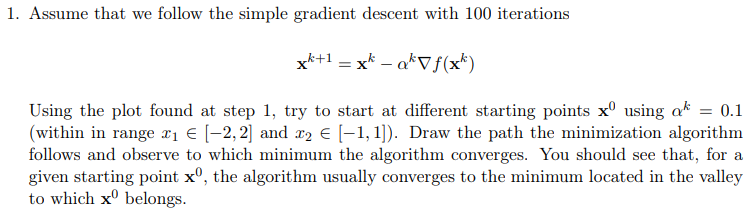

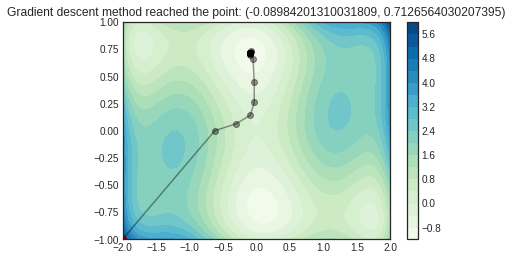

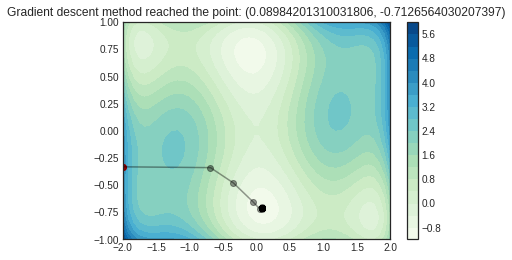

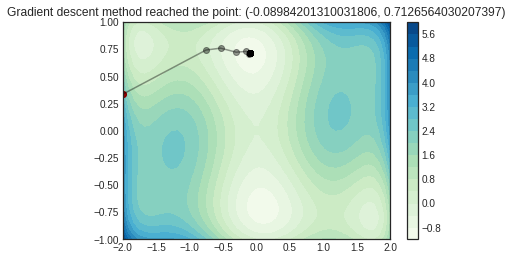

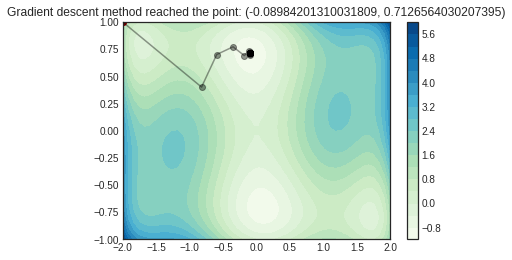

...

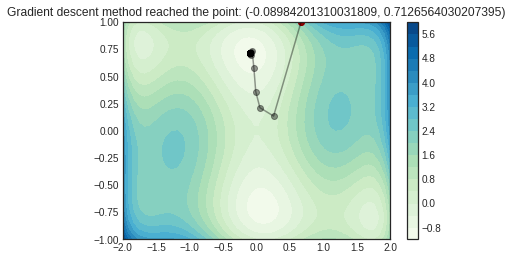

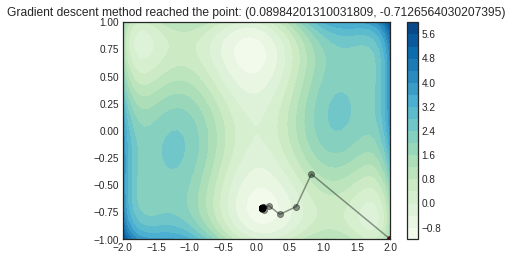

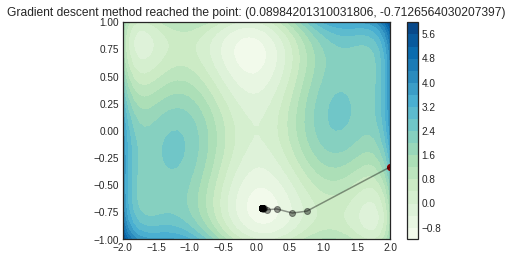

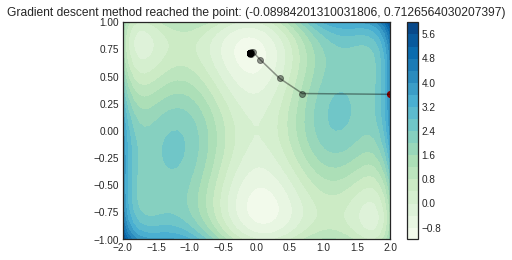

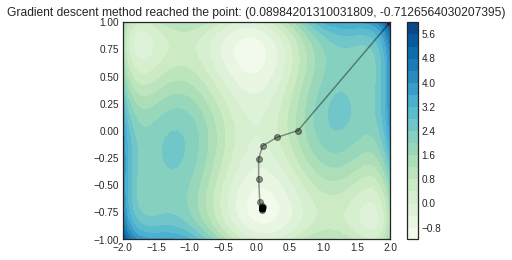

In [32]:
# Defining some parameters -----------------------------------------------------
alpha = 0.1
n_iter = 100

# Generating some initial values -----------------------------------------------
x1_zeros = np.linspace(-2, 2, 4)
x2_zeros = np.linspace(-1, 1, 4)
x_zeros = np.zeros([2, 4*4])        # making a 2x16 vector with the coordinates of some points to use as x0
for i in range(0,4):
  for j in range(0,4):
    x_zeros[0,i+j+i*3] = x1_zeros[i]
    x_zeros[1,i+j+i*3] = x2_zeros[j]

# Contourplot of the graph -----------------------------------------------------
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('seaborn-white')
import numpy as np

def f(x1, x2):
    return (x1**2)*(4-2.1*(x1**2)+1/3*(x1**4))+x1*x2+(x2**2)*(-4+4*(x2**2))

x1 = np.linspace(-2, 2, 50)
x2 = np.linspace(-1, 1, 40)

#Gradient descent function with gradient of the new function -------------------

def gradient_f(x):
  grad = np.zeros([2,1])
  grad[0] = 8*x[0] - 8.4*(x[0]**3) + 2*(x[0]**5) + x[1] 
  grad[1] = x[0] - 8*x[1] + 16*(x[1]**3)
  return grad

def grad_des_ac(x0, alpha, n_iter):
  """ Gradient descent method
  Direction of descent: steepest, alpha: costant
  """

  xk = np.zeros([2,n_iter+1])
  xk[:,[0]] = x0
  for k in range(0, n_iter):
    grad = gradient_f(xk[:,[k]])
    xk[:,[k+1]] = xk[:,[k]] - alpha*grad

  return xk

# Running the method on the 16 chosen initial values of x0 ---------------------

for i in range(0, 16):
  X1, X2 = np.meshgrid(x1, x2)
  Z = f(X1, X2)

  plt.figure()
  plt.contourf(X1, X2, Z, 20, cmap='GnBu')
  plt.colorbar();
  plt.xlim([-2,2])
  plt.ylim([-1,1])
  plt.scatter(x_zeros[0,[i]], x_zeros[1,[i]], c='r')

  xk = grad_des_ac(x_zeros[:,[i]], alpha, n_iter)
  plt.plot(xk[0], xk[1], c='k', alpha=0.4)        # Plotting the path of the xk
  plt.scatter(xk[0], xk[1], c='k', alpha=0.4)     # Scattering points at each step k 
  plt.title("Gradient descent method reached the point: (" + str(xk[0,-1]) + ", " + str(xk[1,-1]) + ")") 

If we keep the original test values of x0 and change the alpha to .05, we will see that more of the minima are found, and in particular the minima closer to the starting point x0, as shown in the following plots:

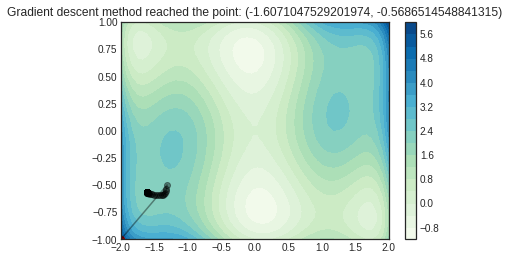

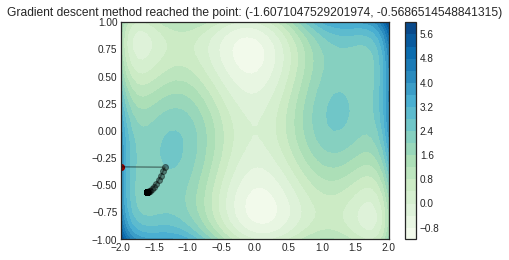

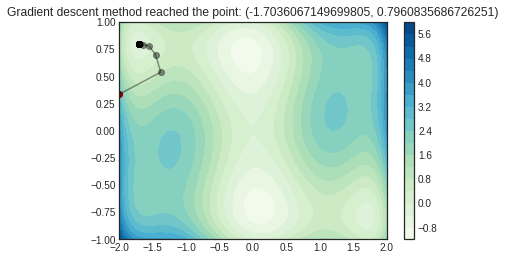

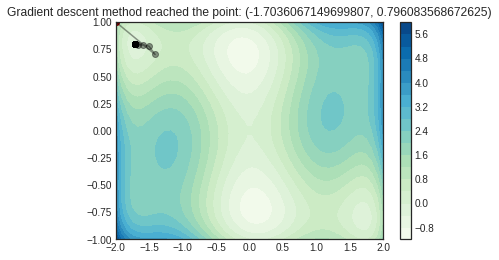

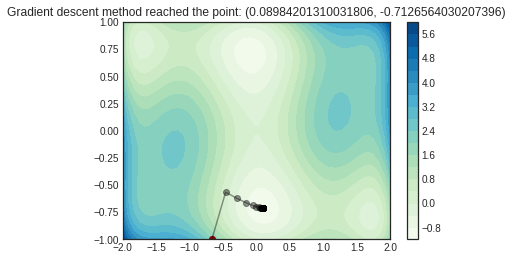

...

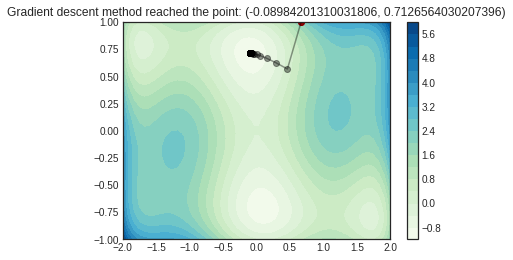

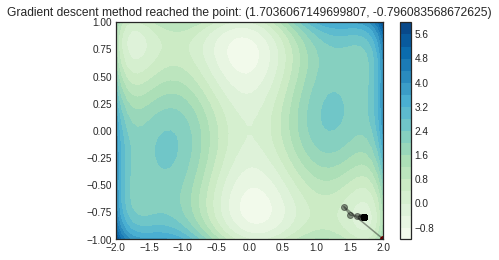

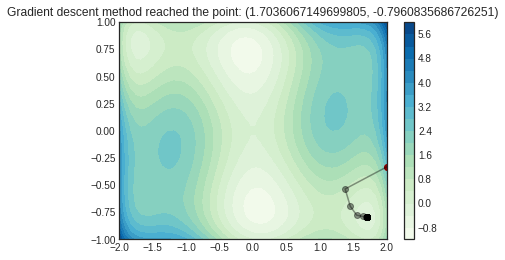

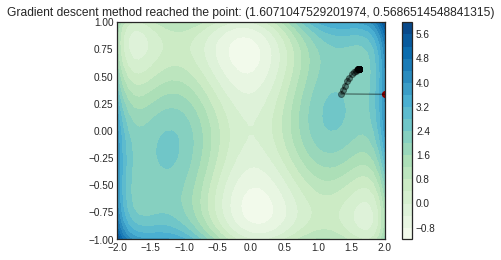

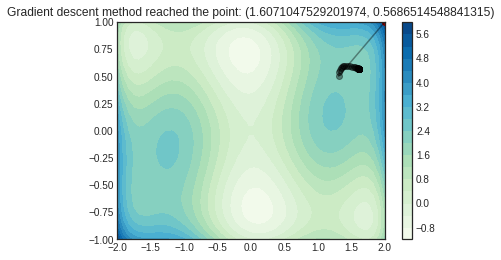

In [33]:
# Defining some parameters -----------------------------------------------------
alpha = 0.05
n_iter = 100

x1_zeros = np.linspace(-2, 2, 4)
x2_zeros = np.linspace(-1, 1, 4)
x_zeros = np.zeros([2, 4*4])        # making a 2x16 vector with the coordinates of some points to use as x0
for i in range(0,4):
  for j in range(0,4):
    x_zeros[0,i+j+i*3] = x1_zeros[i]
    x_zeros[1,i+j+i*3] = x2_zeros[j]

# Contourplot of the graph -----------------------------------------------------
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('seaborn-white')
import numpy as np

def f(x1, x2):
    return (x1**2)*(4-2.1*(x1**2)+1/3*(x1**4))+x1*x2+(x2**2)*(-4+4*(x2**2))

x1 = np.linspace(-2, 2, 50)
x2 = np.linspace(-1, 1, 40)

#Gradient descent function with gradient of the new function -------------------

def gradient_f(x):
  grad = np.zeros([2,1])
  grad[0] = 8*x[0]-8.4*(x[0]**3)+2*(x[0]**5)+x[1] 
  grad[1] = x[0]-8*x[1]+16*(x[1]**3)
  return grad

def grad_des_ac(x0, alpha, n_iter):
  """ Gradient descent method
  Direction of descent: steepest, alpha: costant
  """

  xk = np.zeros([2,n_iter+1])
  xk[:,[0]] = x0
  for k in range(0, n_iter):
    grad = gradient_f(xk[:,[k]])
    xk[:,[k+1]] = xk[:,[k]] - alpha*grad

  return xk

# Running the method on the 16 chosen initial values of x0 ---------------------

for i in range(0, 16):
  plt.figure()
  X1, X2 = np.meshgrid(x1, x2)
  Z = f(X1, X2)

  plt.contourf(X1, X2, Z, 20, cmap='GnBu')
  plt.colorbar();
  plt.xlim([-2,2])
  plt.ylim([-1,1])
  plt.scatter(x_zeros[0,[i]], x_zeros[1,[i]], c='r')

  xk = grad_des_ac(x_zeros[:,[i]], alpha, n_iter)
  plt.plot(xk[0], xk[1], c='k', alpha=0.4)        # Plotting the path of the xk
  plt.scatter(xk[0], xk[1], c='k', alpha=0.4)     # Scattering points at each step k  
  plt.title("Gradient descent method reached the point: (" + str(xk[0,-1]) + ", " + str(xk[1,-1]) + ")") 

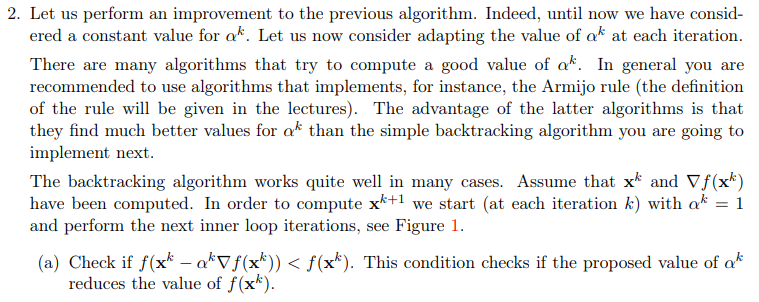

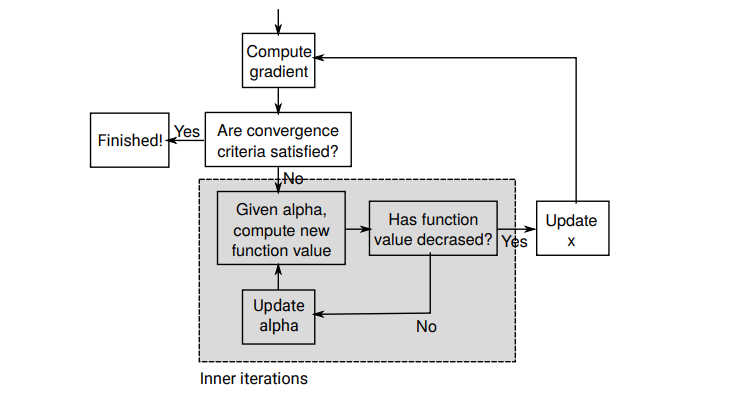

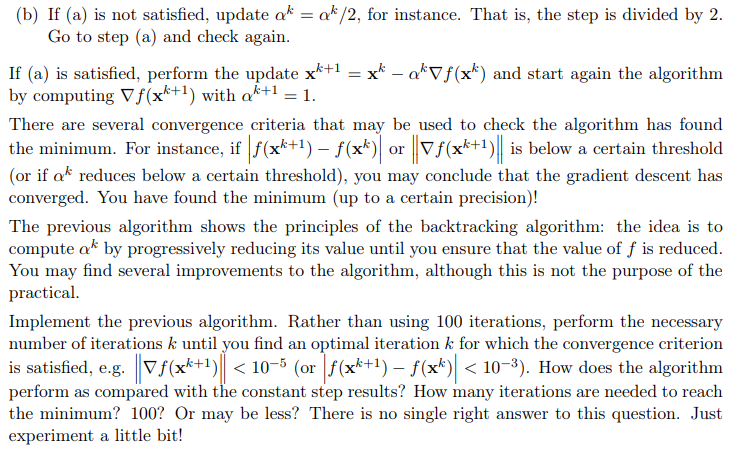

In [34]:
def f(x):
    return (x[0]**2)*(4-2.1*(x[0]**2)+1/3*(x[0]**4))+x[0]*x[1]+(x[1]**2)*(-4+4*(x[1]**2))

def gradient_f(x):
  grad = np.zeros([2,1])
  grad[0] = 8*x[0]-8.4*(x[0]**3)+2*(x[0]**5)+x[1] 
  grad[1] = x[0]-8*x[1]+16*(x[1]**3)
  return grad

def grad_des_improv(x0, tol):     # Defining a gradient descent method with a non-constant step size
  """ Gradient descent method
  Direction of descent: steepest, alpha: adjusted
  Returns xk (2xk+1), k (number of iterations)
  """

  xk = np.zeros([2,1])
  xk[:,[0]] = x0
  k = 0
  grad = np.ones([2,1])                  # Used to initialize the loop, its actual value gets computed as soon as the while loop begins
  while np.sqrt(grad[0]**2+grad[1]**2)>tol:
    grad = gradient_f(xk[:,[k]])
    alpha = 1                       # Initial value of alpha
    xk = np.append(xk, xk[:,[k]] - alpha*grad, axis=1)
    while f(xk[:,[k+1]])>f(xk[:,[k]]):
      alpha = alpha/2           # Update alpha
      xk[:,[k+1]] = xk[:,[k]] - alpha*grad       # Compute xk+1 once again and check if the value of the function has decreased

    k = k+1

  return xk, k

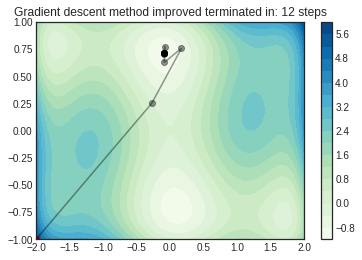

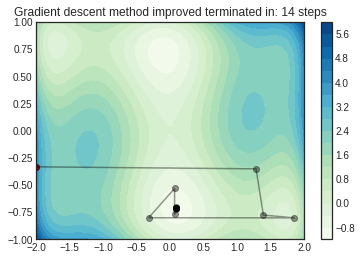

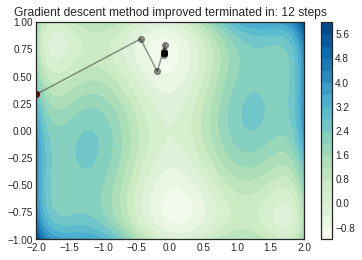

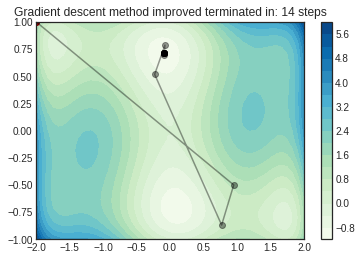

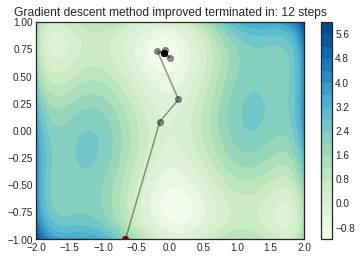

...

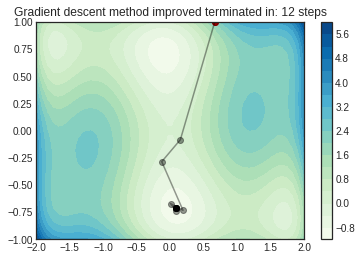

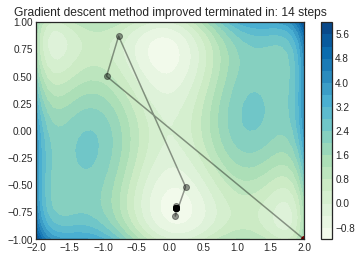

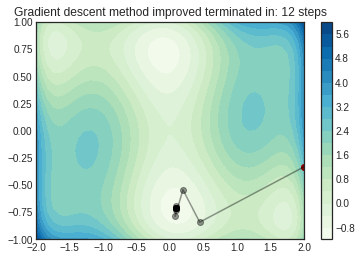

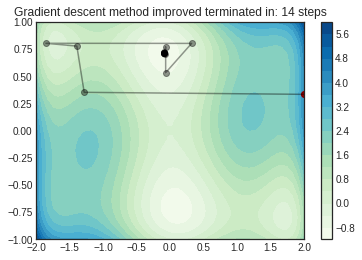

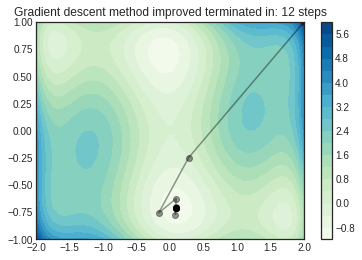

In [35]:
# Contourplot of the function --------------------------------------------------
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('seaborn-white')
import numpy as np

def f_aux(x1, x2):
    return (x1**2)*(4-2.1*(x1**2)+1/3*(x1**4))+x1*x2+(x2**2)*(-4+4*(x2**2))

# Computing some intial values x0
N = 4
x1_zeros = np.linspace(-2, 2, N)
x2_zeros = np.linspace(-1, 1, N)
x_zeros = np.zeros([2, N*N])        # making a 2x16 vector with the coordinates of some points to use as x0
for i in range(0,N):
  for j in range(0,N):
    x_zeros[0,i+j+i*(N-1)] = x1_zeros[i]
    x_zeros[1,i+j+i*(N-1)] = x2_zeros[j]

x1 = np.linspace(-2, 2, 50)
x2 = np.linspace(-1, 1, 40)

X1, X2 = np.meshgrid(x1, x2)
Z = f_aux(X1, X2)

# Running the descent method on the computed initial values --------------------
tol = 1e-5

for i in range(0, N*N):
  plt.figure()
  plt.contourf(X1, X2, Z, 20, cmap='GnBu')
  plt.colorbar();
  plt.xlim([-2,2])
  plt.ylim([-1,1])
  plt.scatter(x_zeros[0,[i]], x_zeros[1, [i]], c='r')

  xk, k = grad_des_improv(x_zeros[:,[i]], tol)
  plt.plot(xk[0], xk[1], c='k', alpha=0.4)        # Plotting the path of the xk
  plt.scatter(xk[0], xk[1], c='k', alpha=0.4)     # Scattering points at each step k
  plt.title("Gradient descent method improved terminated in: " + str(k) + " steps")

The method performs better than the one using a constant step size. It generally converged in less than 20 steps

# **Ex.1 - Gradient descent methods | 1.3 The Rosenbrock function**

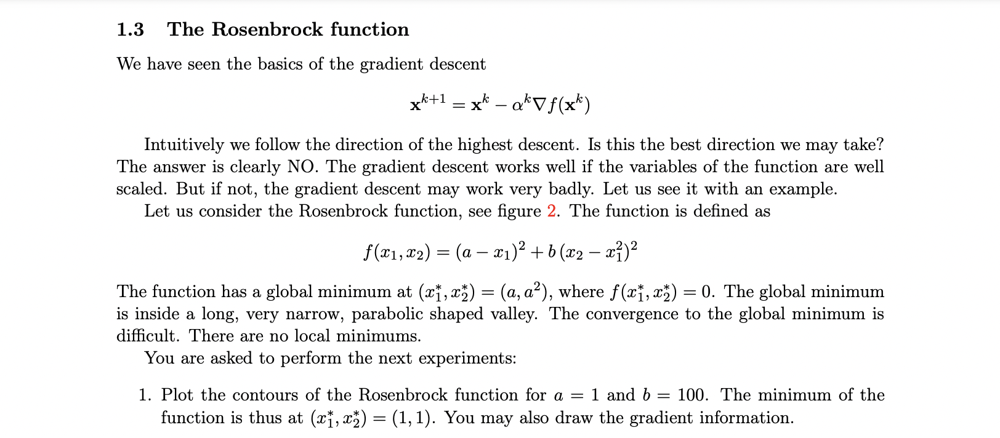

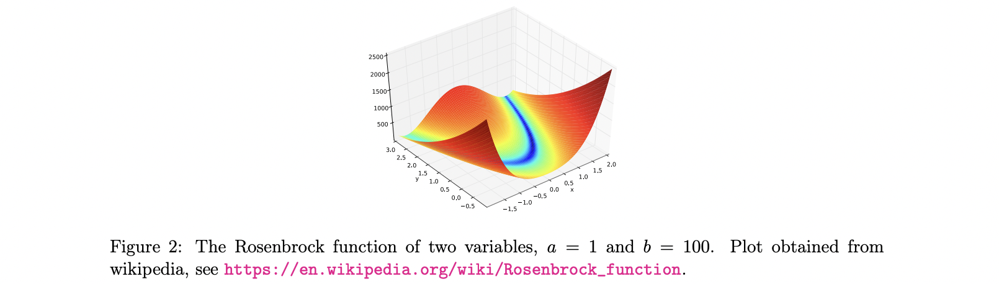

/usr/local/lib/python3.7/dist-packages/mpl_toolkits/mplot3d/art3d.py:304: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  self._segments3d = np.asanyarray(segments)


Text(0.5, 0, 'z')

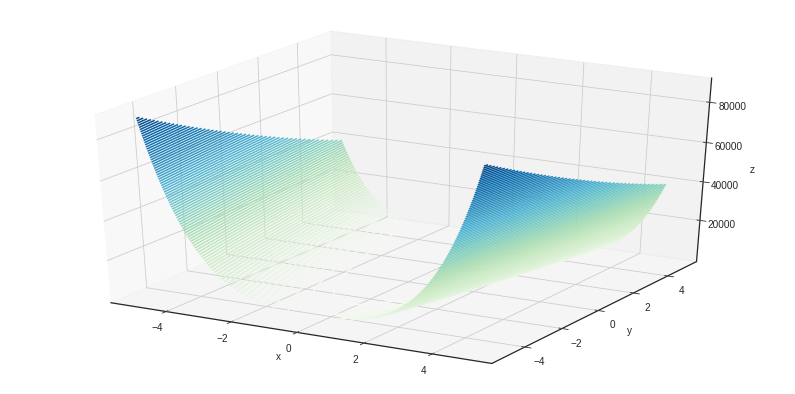

In [36]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('seaborn-white')

# Define the Rosenbrock function -----------------------------------------------
def f(x, a=1, b=100):
  res = (a-x[0])**2+b*((x[1]-(x[0]**2))**2)
  return res

def f_aux(x1, x2, a=1, b=100):
  res = ((a-x1)**2)+b*((x2-(x1**2))**2)
  return res

# Plot the Rosenbrock function with a=1, b=100 ---------------------------------
# In this case the minimum will be at (1,1)
xlim = 5
ylim= 5

x1 = np.linspace(-xlim, xlim, 100)
x2 = np.linspace(-ylim, ylim, 100)

X1, X2 = np.meshgrid(x1, x2)
Z = f_aux(X1, X2)

fig = plt.figure(figsize=(14, 7))
ax = plt.axes(projection='3d')
ax.contour3D(X1, X2, Z, 100, cmap='GnBu')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')

(-5.0, 5.0)

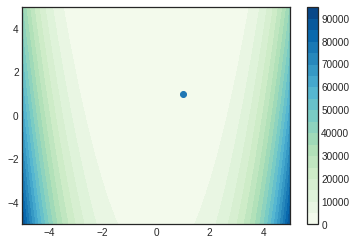

In [37]:
plt.contourf(X1, X2, Z, 20, cmap='GnBu')
plt.colorbar();
plt.scatter(1,1)
plt.xlim([-xlim, xlim])
plt.ylim([-ylim,ylim])

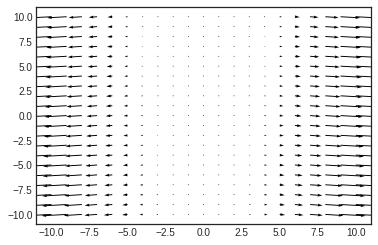

In [38]:
import numpy as np
import matplotlib.pyplot as plt
import sympy

a=1
b=100

x1,x2=sympy.symbols('x1 x2')
f=((a-x1)**2)+b*((x2-(x1**2))**2)

#symbolical gradient
gradf=[sympy.diff(f,var) for var in (x1,x2)]

#turn into a bivariate lambda for numpy
numgradf=sympy.lambdify([x1,x2],gradf)

X1,X2=np.meshgrid(np.arange(-10,11),np.arange(-10,11))
graddat=numgradf(X1,X2)

plt.figure()
plt.quiver(X1,X2,graddat[0],graddat[1])
plt.show()

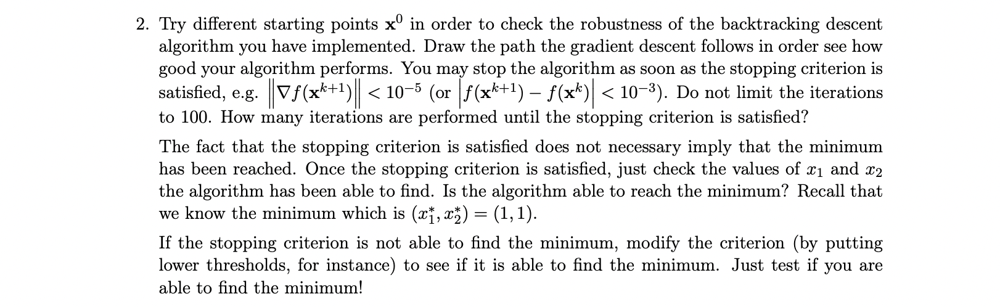

**DISCLAIMER: Run this following block only in case of need: it's time demanding to compute. It is repeated after these blocks including a stop condition on the number of iterations, which takes considerably less time**

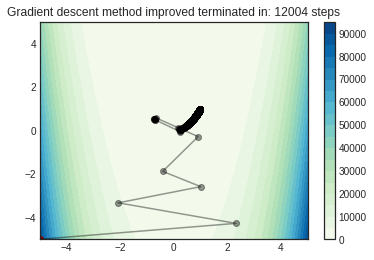

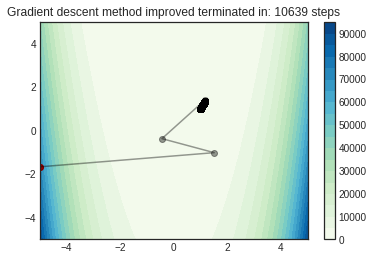

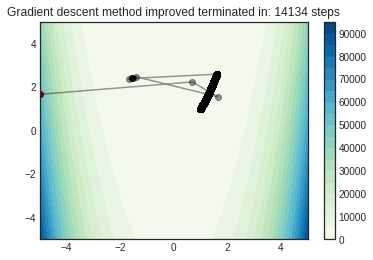

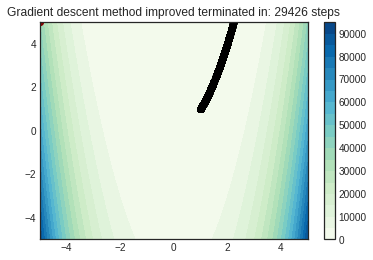

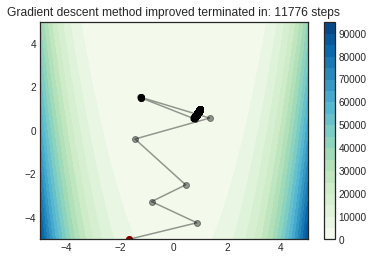

...

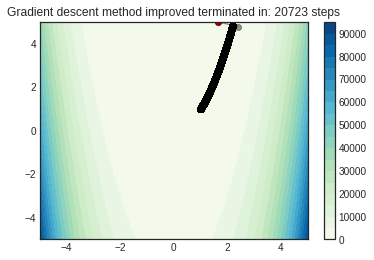

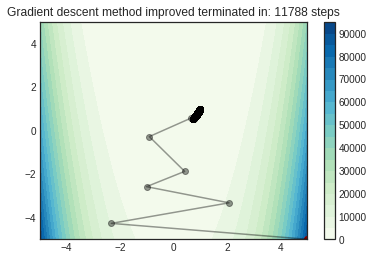

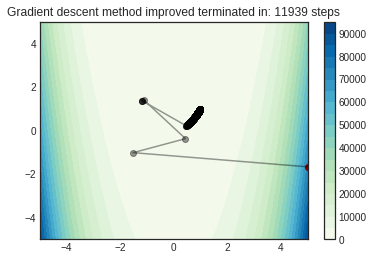

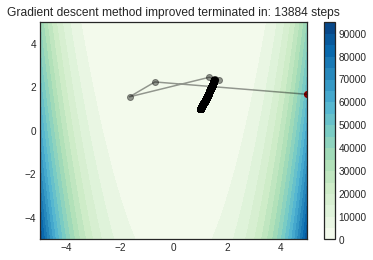

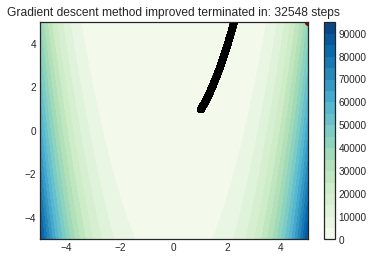

In [39]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('seaborn-white')
import numpy as np

# Define the Rosenbrock function -----------------------------------------------
def f(x, a=1, b=100):
  res = (a-x[0])**2+b*((x[1]-(x[0]**2))**2)
  return res

def f_aux(x1, x2, a=1, b=100):
  res = ((a-x1)**2)+b*((x2-(x1**2))**2)
  return res

# Define the corresponding gradient function of f(x) ---------------------------
def gradient_f(x, a=1, b=100):
  grad = np.zeros([2,1])
  grad[0] = 4*b*(x[0]**3)+2*x[0]*(1-2*b*x[1])-2*a
  grad[1] = 2*b*(x[1]-(x[0]**2))
  return grad

# Define the gradient descent method -------------------------------------------
def grad_des_improv(x0, tol, a=1, b=100):     # Defining a gradient descent method with a non-constant step size
  """ Gradient descent method
  Direction of descent: steepest, alpha: adjusted
  Returns xk (2xk+1), k (number of iterations)
  """

  xk = np.zeros([2,1])
  xk[:,[0]] = x0
  k = 0
  grad = np.ones([2,1])                  # Used to initialize the loop, its actual value gets computed as soon as the while loop begins
  while np.sqrt(grad[0]**2+grad[1]**2)>tol:
    grad = gradient_f(xk[:,[k]], a, b)
    alpha = 1                       # Initial value of alpha
    xk = np.append(xk, xk[:,[k]] - alpha*grad, axis=1)
    while f(xk[:,[k+1]], a, b)>f(xk[:,[k]], a, b):
      alpha = alpha/2           # Update alpha
      xk[:,[k+1]] = xk[:,[k]] - alpha*grad       # Compute xk+1 once again and check if the value of the function has decreased

    k = k+1

  return xk, k

# Plot the Rosenbrock function with a=1, b=100 ---------------------------------
# In this case the minimum will be at (1,1)
xlim = 5
ylim= 5

x1 = np.linspace(-xlim, xlim, 100)
x2 = np.linspace(-ylim, ylim, 100)

# Computing some intial values x0 and plotting them ----------------------------
N = 4
x1_zeros = np.linspace(-xlim, xlim, N)
x2_zeros = np.linspace(-ylim, ylim, N)
x_zeros = np.zeros([2, N*N])        # making a 2x16 vector with the coordinates of some points to use as x0
for i in range(0,N):
  for j in range(0,N):
    x_zeros[0,i+j+i*(N-1)] = x1_zeros[i]
    x_zeros[1,i+j+i*(N-1)] = x2_zeros[j]

# Running the descent method on the computed initial values --------------------
tol = 1e-5

for i in range(0, N*N):
  X1, X2 = np.meshgrid(x1, x2)
  Z = f_aux(X1, X2, a, b)

  plt.figure()
  plt.contourf(X1, X2, Z, 20, cmap='GnBu')
  plt.colorbar();
  plt.xlim([-xlim, xlim])
  plt.ylim([-ylim,ylim])
  plt.scatter(x_zeros[0,[i]], x_zeros[1,[i]], c='r')

  xk, k = grad_des_improv(x_zeros[:,[i]], tol)
  plt.title("Gradient descent method improved terminated in: " + str(k) + " steps")
  plt.plot(xk[0], xk[1], c='k', alpha=0.4)        # Plotting the path of the xk
  plt.scatter(xk[0], xk[1], c='k', alpha=0.4)     # Scattering points at each step k

**DISCLAIMER: Run this following block only in case of need: it's time demanding to compute. It is repeated after these blocks including a stop condition on the number of iterations, which takes considerably less time**

In [40]:
# Controlling what's the distance between the minimum reached from the different starting points and the actual minimum
XK = np.zeros([2, N*N])         # Initialize the arrays to store the values
K = np.zeros(N*N)           
DIST = np.zeros(N*N)

for i in range(0, N*N):
  xk, k = grad_des_improv(x_zeros[:,[i]], tol)
  XK[:,[i]] = xk[:,[-1]]
  K[i] = k
  print("Gradient descent method improved terminated in: " + str(k) + " steps")
  print("The method has reached the point: " + str(xk[0,[-1]]) + ", " + str(xk[1,[-1]]))
  dist = np.sqrt((1-xk[0,[-1]])**2+(1-xk[1,[-1]])**2)
  DIST[i] = dist
  print("Distance from the actual solution: " + str(dist))

Gradient descent method improved terminated in: 12004 steps
The method has reached the point: [0.99999225], [0.99998442]
Distance from the actual solution: [1.73994709e-05]
Gradient descent method improved terminated in: 10639 steps
The method has reached the point: [1.0000078], [1.00001567]
Distance from the actual solution: [1.75057004e-05]
Gradient descent method improved terminated in: 14134 steps
The method has reached the point: [1.00000785], [1.00001569]
Distance from the actual solution: [1.75444111e-05]
Gradient descent method improved terminated in: 29426 steps
The method has reached the point: [1.00000782], [1.00001563]
Distance from the actual solution: [1.74737015e-05]
Gradient descent method improved terminated in: 11776 steps
The method has reached the point: [0.99999209], [0.9999842]
Distance from the actual solution: [1.76640256e-05]
Gradient descent method improved terminated in: 11826 steps
The method has reached the point: [0.99999222], [0.99998436]
Distance from th

In [41]:
# Show the results with better visualization -----------------------------------
import pandas as pd

data = np.zeros([len(K), 4]).astype(object)

data[:,0] = XK[0]
data[:,1] = XK[1]
data[:,2] = DIST
data[:,3] = K

df = pd.DataFrame(data)
df.columns = ['x', 'y', 'Distance from minimum', 'Number of iterations']
df

,x,y,Distance from minimum,Number of iterations
0,0.999992,0.999984,0.000017,12004.0
1,1.000008,1.000016,0.000018,10639.0
2,1.000008,1.000016,0.000018,14134.0
3,1.000008,1.000016,0.000017,29426.0
4,0.999992,0.999984,0.000018,11776.0
5,0.999992,0.999984,0.000017,11826.0
6,1.000008,1.000016,0.000018,14037.0
7,1.000008,1.000016,0.000017,21782.0
8,1.000008,1.000015,0.000017,11404.0
9,0.999992,0.999984,0.000017,10855.0


OBSERVATIONS: </br>
- The algorithm seems to converge to a solution, but the number of iterations required is incredibly larger than before
- If we reasonably include a stopping criteria on the number of iterations as well, the method will not reach the minimum (This will be implemented in the following sections)

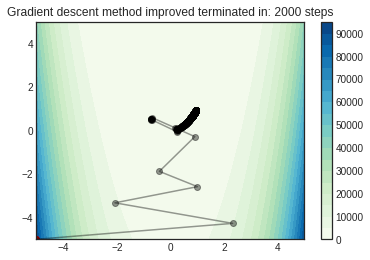

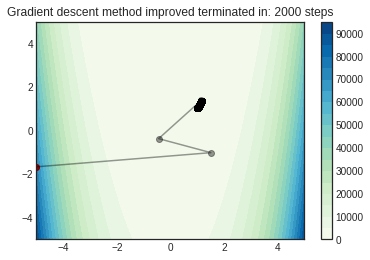

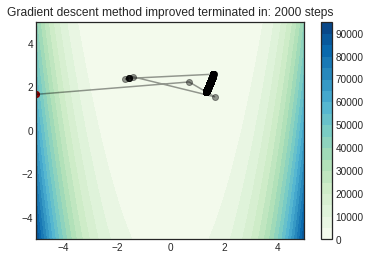

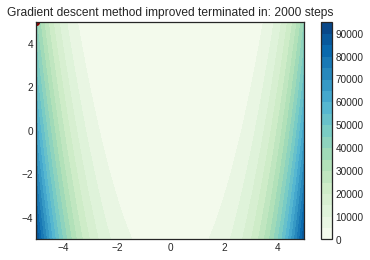

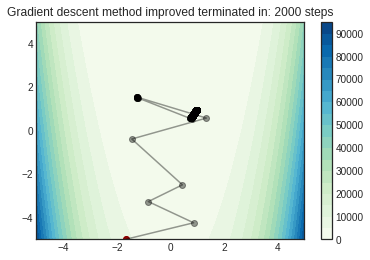

...

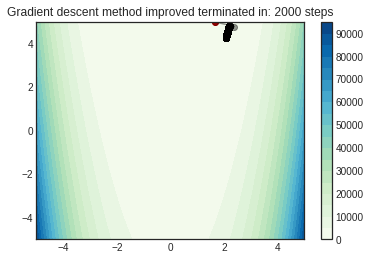

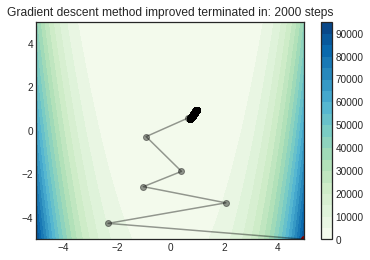

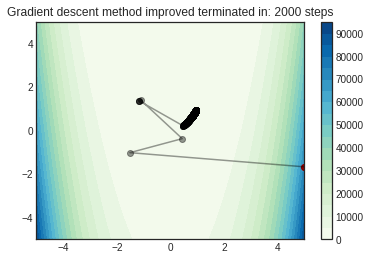

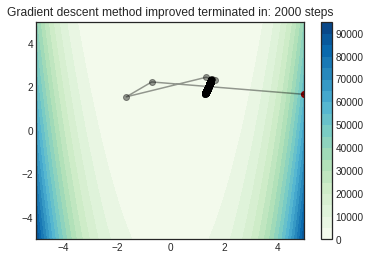

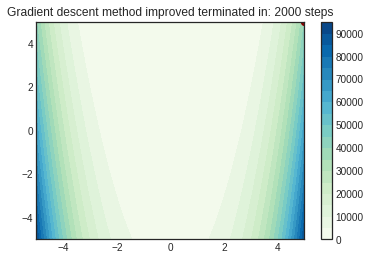

In [42]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('seaborn-white')
import numpy as np

# Define the Rosenbrock function -----------------------------------------------
def f(x, a=1, b=100):
  res = (a-x[0])**2+b*((x[1]-(x[0]**2))**2)
  return res

def f_aux(x1, x2, a=1, b=100):
  res = ((a-x1)**2)+b*((x2-(x1**2))**2)
  return res

# Define the corresponding gradient function of f(x) ---------------------------
def gradient_f(x, a=1, b=100):
  grad = np.zeros([2,1])
  grad[0] = 4*b*(x[0]**3)+2*x[0]*(1-2*b*x[1])-2*a
  grad[1] = 2*b*(x[1]-(x[0]**2))
  return grad

# Define the gradient descent method -------------------------------------------
def grad_des_improv(x0, tol, a=1, b=100):     # Defining a gradient descent method with a non-constant step size
  """ Gradient descent method
  Direction of descent: steepest, alpha: adjusted
  Returns xk (2xk+1), k (number of iterations)
  """

  xk = np.zeros([2,1])
  xk[:,[0]] = x0
  k = 0
  grad = np.ones([2,1])                  # Used to initialize the loop, its actual value gets computed as soon as the while loop begins
  while np.sqrt(grad[0]**2+grad[1]**2)>tol:
    grad = gradient_f(xk[:,[k]], a, b)
    alpha = 1                       # Initial value of alpha
    xk = np.append(xk, xk[:,[k]] - alpha*grad, axis=1)
    while f(xk[:,[k+1]], a, b)>f(xk[:,[k]], a, b):
      alpha = alpha/2           # Update alpha
      xk[:,[k+1]] = xk[:,[k]] - alpha*grad       # Compute xk+1 once again and check if the value of the function has decreased

    k = k+1

    if k>=2000:
      return xk, k

  return xk, k

# Plot the Rosenbrock function with a=1, b=100 ---------------------------------
# In this case the minimum will be at (1,1)
xlim = 5
ylim= 5

x1 = np.linspace(-xlim, xlim, 100)
x2 = np.linspace(-ylim, ylim, 100)

# Computing some intial values x0 and plotting them ----------------------------
N = 4
x1_zeros = np.linspace(-xlim, xlim, N)
x2_zeros = np.linspace(-ylim, ylim, N)
x_zeros = np.zeros([2, N*N])        # making a 2x16 vector with the coordinates of some points to use as x0
for i in range(0,N):
  for j in range(0,N):
    x_zeros[0,i+j+i*(N-1)] = x1_zeros[i]
    x_zeros[1,i+j+i*(N-1)] = x2_zeros[j]

# Running the descent method on the computed initial values --------------------
tol = 1e-5

for i in range(0, N*N):
  X1, X2 = np.meshgrid(x1, x2)
  Z = f_aux(X1, X2, a, b)

  plt.figure()
  plt.contourf(X1, X2, Z, 20, cmap='GnBu')
  plt.colorbar();
  plt.xlim([-xlim, xlim])
  plt.ylim([-ylim,ylim])
  plt.scatter(x_zeros[0,[i]], x_zeros[1,[i]], c='r')

  xk, k = grad_des_improv(x_zeros[:,[i]], tol)
  plt.title("Gradient descent method improved terminated in: " + str(k) + " steps")
  plt.plot(xk[0], xk[1], c='k', alpha=0.4)        # Plotting the path of the xk
  plt.scatter(xk[0], xk[1], c='k', alpha=0.4)     # Scattering points at each step k

In [43]:
# Checking what's the distance between the minimum reached from the different starting points and the actual minimum
XK = np.zeros([2, N*N])         # Initialize the arrays to store the values
K = np.zeros(N*N)           
DIST = np.zeros(N*N)

for i in range(0, N*N):
  xk, k = grad_des_improv(x_zeros[:,[i]], tol)
  XK[:,[i]] = xk[:,[-1]]
  K[i] = k
  print("Gradient descent method improved terminated in: " + str(k) + " steps")
  print("The method has reached the point: " + str(xk[0,[-1]]) + ", " + str(xk[1,[-1]]))
  dist = np.sqrt((1-xk[0,[-1]])**2+(1-xk[1,[-1]])**2)
  DIST[i] = dist
  print("Distance from the actual solution: " + str(dist))

Gradient descent method improved terminated in: 2000 steps
The method has reached the point: [0.97069885], [0.94195877]
Distance from the actual solution: [0.06501801]
Gradient descent method improved terminated in: 2000 steps
The method has reached the point: [1.00833494], [1.01674345]
Distance from the actual solution: [0.01870333]
Gradient descent method improved terminated in: 2000 steps
The method has reached the point: [1.3326607], [1.77635758]
Distance from the actual solution: [0.84462669]
Gradient descent method improved terminated in: 2000 steps
The method has reached the point: [2.70183333], [7.30255308]
Distance from the actual solution: [6.52827787]
Gradient descent method improved terminated in: 2000 steps
The method has reached the point: [0.97567412], [0.95194978]
Distance from the actual solution: [0.05385696]
Gradient descent method improved terminated in: 2000 steps
The method has reached the point: [0.9749243], [0.95030201]
Distance from the actual solution: [0.0556

In [44]:
# Show the results with better visualization -----------------------------------
import pandas as pd

data = np.zeros([len(K), 4]).astype(object)

data[:,0] = XK[0]
data[:,1] = XK[1]
data[:,2] = DIST
data[:,3] = K

df = pd.DataFrame(data)
df.columns = ['x', 'y', 'Distance from minimum', 'Number of iterations']
df

,x,y,Distance from minimum,Number of iterations
0,0.970699,0.941959,0.065018,2000.0
1,1.008335,1.016743,0.018703,2000.0
2,1.332661,1.776358,0.844627,2000.0
3,2.701833,7.302553,6.528278,2000.0
4,0.975674,0.95195,0.053857,2000.0
5,0.974924,0.950302,0.055666,2000.0
6,1.334319,1.780896,0.849452,2000.0
7,2.15847,4.660736,3.839666,2000.0
8,1.02999,1.060739,0.067739,2000.0
9,0.989278,0.978587,0.023948,2000.0


OBSERVATION: As we were expecting, constraining the number of iterations in order to avoid a long computational time, makes the method not converge to the minimum for a number of different initial values

# **Ex.2 - Newton descent method | 2.1 A simple quadratic function**

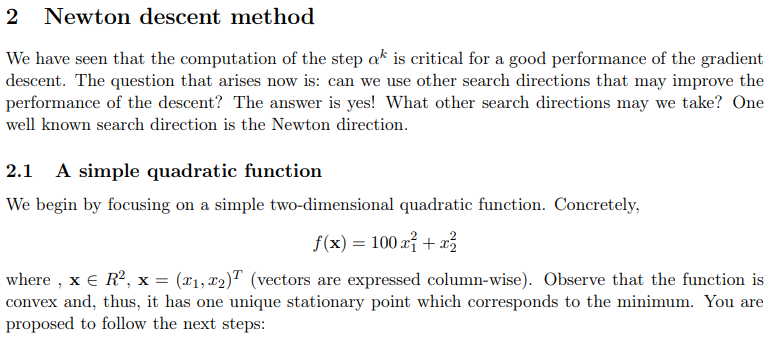

**Visualize the function**

Text(0.5, 0, 'z')

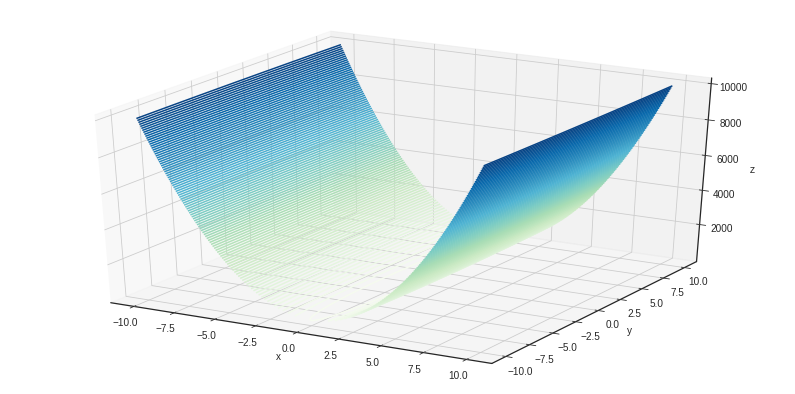

In [45]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('seaborn-white')

# Define the function f(x) -----------------------------------------------------
def f(x):
  res = 100*(x[0]**2) + x[1]**2
  return res

def f_aux(x1, x2):
  res = 100*(x1**2) + x2**2
  return res

# Visualize the function -------------------------------------------------------
xlim = 10
ylim = 10

x1 = np.linspace(-xlim, xlim, 1000)   # Since x1 is multiplied by a coefficient of 100, in order to visualize the minimum located in (0, 0) we use different limits on the axis
x2 = np.linspace(-ylim, ylim, 1000)

X1, X2 = np.meshgrid(x1, x2)
Z = f_aux(X1, X2)

fig = plt.figure(figsize=(14, 7))
ax = plt.axes(projection='3d')
ax.contour3D(X1, X2, Z, 100, cmap='GnBu')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')

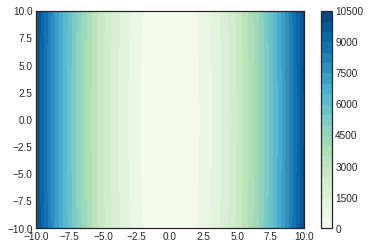

In [46]:
X1, X2 = np.meshgrid(x1, x2)
Z = f_aux(X1, X2)

plt.contourf(X1, X2, Z, 20, cmap='GnBu')
plt.colorbar();

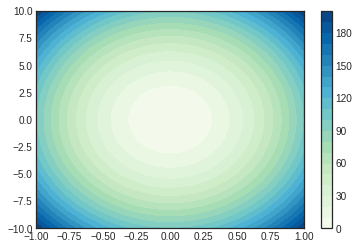

In [47]:
# Visualize the function with unbalanced axis in order to visualize the minimum. The function is convex  but heavily unbalanced on x1, that's why it appears 
# very different in the two plots
plt.style.use('seaborn-white')

xlim = 1
ylim = 10

x = np.linspace(-xlim, xlim, 1000)      # Since x1 is multiplied by a coefficient of 100, in order to visualize the minimum located in (0, 0) we use different limits on the axis
y = np.linspace(-ylim, ylim, 1000)

X, Y = np.meshgrid(x, y)
Z = f_aux(X, Y)

plt.contourf(X, Y, Z, 20, cmap='GnBu')
plt.colorbar();

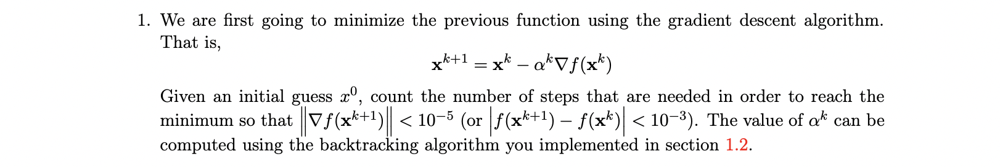

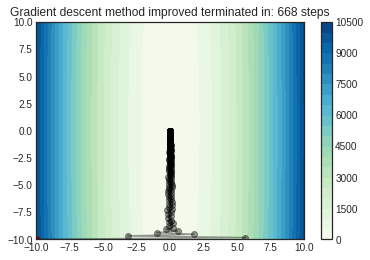

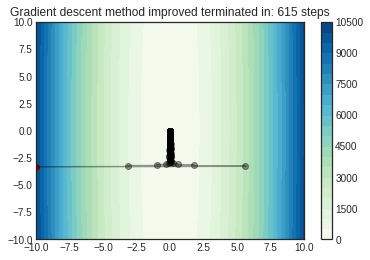

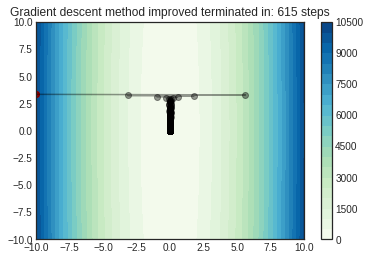

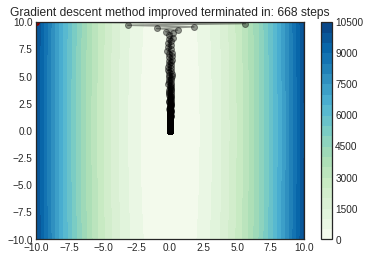

...

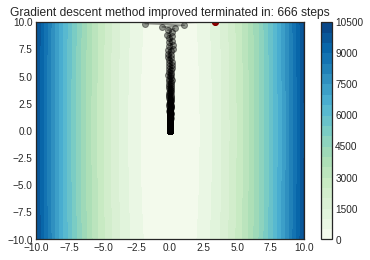

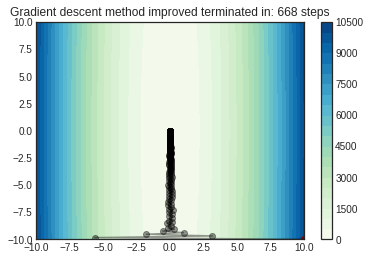

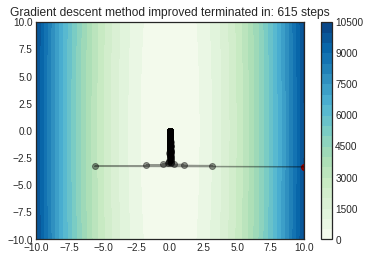

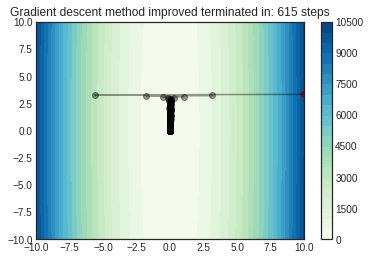

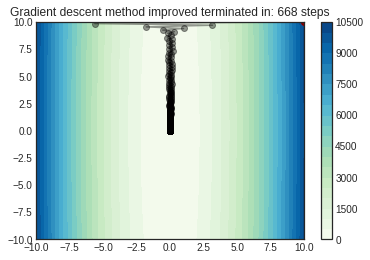

In [48]:
# Defining the gradient of f(x) ------------------------------------------------
def gradient_f(x):
  grad = np.zeros([2,1])
  grad[0] = 200*x[0]
  grad[1] = 2*x[1]
  return grad

# Defining the gradient descent method -----------------------------------------
def grad_des_improv(x0, tol):     # Defining a gradient descent method with a non-constant step size
  """ Gradient descent method
  Direction of descent: steepest, alpha: adjusted
  Returns xk (2xk+1), k (number of iterations)
  """

  xk = np.zeros([2,1])
  xk[:,[0]] = x0
  k = 0
  grad = np.ones([2,1])                  # Used to initialize the loop, its actual value gets computed as soon as the while loop begins
  while np.sqrt(grad[0]**2+grad[1]**2)>tol:
    grad = gradient_f(xk[:,[k]])
    alpha = 1                       # Initial value of alpha
    xk = np.append(xk, xk[:,[k]] - alpha*grad, axis=1)
    while f(xk[:,[k+1]])>f(xk[:,[k]]):            # Backtracking algorithm to adjust alpha_k
      alpha = alpha/2           # Update alpha
      xk[:,[k+1]] = xk[:,[k]] - alpha*grad        # Compute xk+1 once again and check if the value of the function has decreased

    k = k+1

  return xk, k

# Defining some parameters -----------------------------------------------------
tol = 1e-5

xlim = 10
ylim = 10

x = np.linspace(-xlim, xlim, 1000)      
y = np.linspace(-ylim, ylim, 1000)

X, Y = np.meshgrid(x, y)
Z = f_aux(X, Y)

# Generating some initial values -----------------------------------------------
N = 4
x1_zeros = np.linspace(-xlim, xlim, N)
x2_zeros = np.linspace(-ylim, ylim, N)
x_zeros = np.zeros([2, N*N])        # making a 2x9 vector with the coordinates of some points to use as x0
for i in range(0,N):
  for j in range(0,N):
    x_zeros[0,i+j+i*(N-1)] = x1_zeros[i]
    x_zeros[1,i+j+i*(N-1)] = x2_zeros[j]

# Running the descent method on the computed initial values --------------------
for i in range(0, N*N):
  plt.figure()
  plt.contourf(X, Y, Z, 20, cmap='GnBu')
  plt.colorbar();
  plt.scatter(x_zeros[0,[i]], x_zeros[1,[i]], c='r')

  xk, k = grad_des_improv(x_zeros[:,[i]], tol)
  plt.plot(xk[0], xk[1], c='k', alpha=0.4)        # Plotting the path of the xk
  plt.scatter(xk[0], xk[1], c='k', alpha=0.4)     # Scattering points at each step k
  plt.title("Gradient descent method improved terminated in: " + str(k) + " steps")

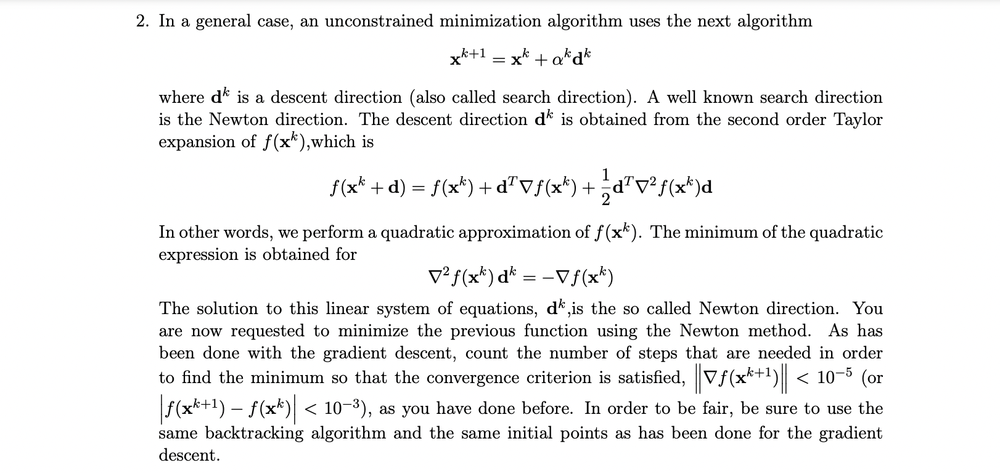

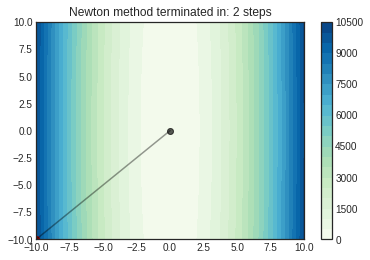

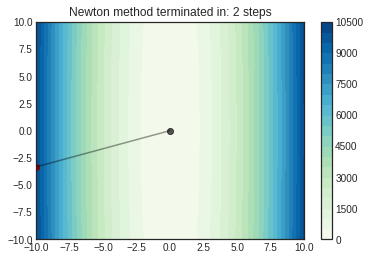

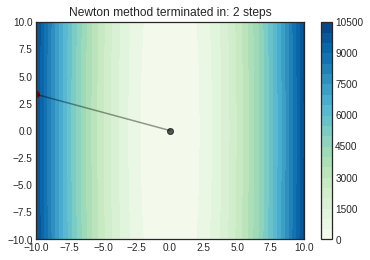

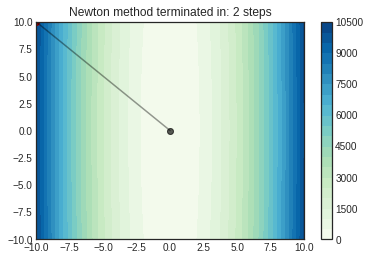

...

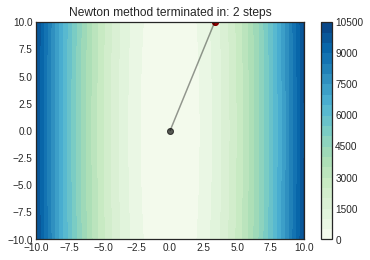

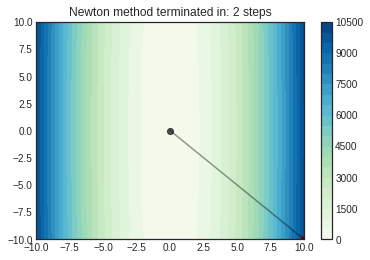

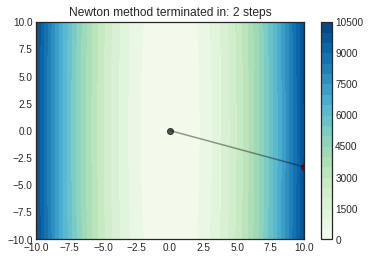

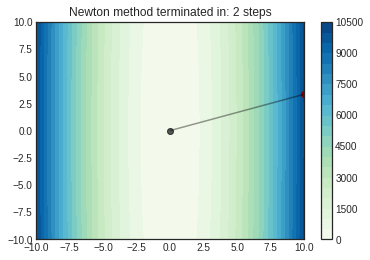

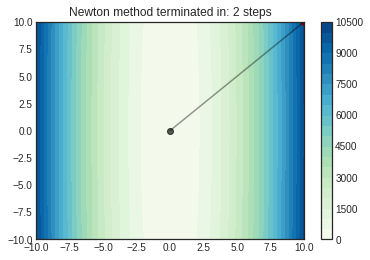

In [49]:
# Defining the gradient of f(x) ------------------------------------------------
def gradient_f(x):
  grad = np.zeros([2,1])
  grad[0] = 200*x[0]
  grad[1] = 2*x[1]
  return grad

# Defining the Hessian of f(x) -------------------------------------------------
def hessian_f(x):
  H = np.zeros([2,2])
  H[0,0] = 200
  H[0,1] = 0
  H[1,0] = 0
  H[1,1] = 2
  return H

# Defining the Newton method ---------------------------------------------------
def newton(x0, tol):     # Defining a gradient descent method with a non-constant step size
  """ Newton method
  Direction of descent: newton direction, alpha: adjusted
  Returns xk (2xk+1), k (number of iterations)
  """

  xk = np.zeros([2,1])
  xk[:,[0]] = x0
  k = 0
  grad = np.ones([2,1])                  # Used to initialize the loop, its actual value gets computed as soon as the while loop begins
  while np.sqrt(grad[0]**2+grad[1]**2)>tol:
    grad = gradient_f(xk[:,[k]])
    H = hessian_f(xk[:,[k]])
    alpha = 1                       # Initial value of alpha
    dk = np.linalg.solve(H, grad)
    xk = np.append(xk, xk[:,[k]] - alpha*dk, axis=1)
    while f(xk[:,[k+1]])>f(xk[:,[k]]):            # Backtracking algorithm to adjust alpha_k
      alpha = alpha/2           # Update alpha
      xk[:,[k+1]] = xk[:,[k]] - alpha*dk        # Compute xk+1 once again and check if the value of the function has decreased

    k = k+1

  return xk, k 
  
# Defining some parameters -----------------------------------------------------
tol = 1e-5

xlim = 10
ylim = 10

x = np.linspace(-xlim, xlim, 1000)      
y = np.linspace(-ylim, ylim, 1000)

X, Y = np.meshgrid(x, y)
Z = f_aux(X, Y)

# Generating some initial values -----------------------------------------------
N = 4
x1_zeros = np.linspace(-xlim, xlim, N)
x2_zeros = np.linspace(-ylim, ylim, N)
x_zeros = np.zeros([2, N*N])        # making a 2x16 vector with the coordinates of some points to use as x0
for i in range(0,N):
  for j in range(0,N):
    x_zeros[0,i+j+i*(N-1)] = x1_zeros[i]
    x_zeros[1,i+j+i*(N-1)] = x2_zeros[j]

# Running the descent method on the computed initial values --------------------
for i in range(0, N*N):
  plt.figure()
  plt.contourf(X, Y, Z, 20, cmap='GnBu')
  plt.colorbar();
  plt.scatter(x_zeros[0,[i]], x_zeros[1,[i]], c='r')

  xk, k = newton(x_zeros[:,[i]], tol)
  plt.plot(xk[0], xk[1], c='k', alpha=0.4)        # Plotting the path of the xk
  plt.scatter(xk[0], xk[1], c='k', alpha=0.4)     # Scattering points at each step k
  plt.title("Newton method terminated in: " + str(k) + " steps")

OBSERVATIONS: </br>
- The Newthon methods performs really well, starting from a stepsize of alpha=1. The fact that it takes only on step is due to the value of alpha and of the computed direction. With other functions it would perform differently
- However, the fact that it performs well is not a coincidence. The function is convex, and even starting with an initial value far away from the minimum, the Newthon methods has no issues reaching the minimum. 
- The output of the methods gives '2 steps' instead of 1 simply because it requires one more iteration in order to enter the while loop and update the gradient to the value that satisfies the stopping condition NORM(Grad)<=TOL


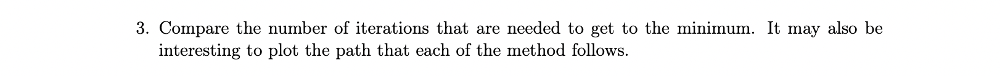

OBSERVATIONS: </br>
- Comparing the Newthon method with the Gradient descent method previously implemented, this method performs undoubtably better. 
- However we should also take into consideration that this specific function is a use case in which the Newthon method is heavily favored (it is convex) and the Gradient descent method is heavily punished (the gradient is very unbalanced on one of the two directions, creating a ravine)

# **Ex.2 - Newton descent method | 2.2 A function with multiple minima**

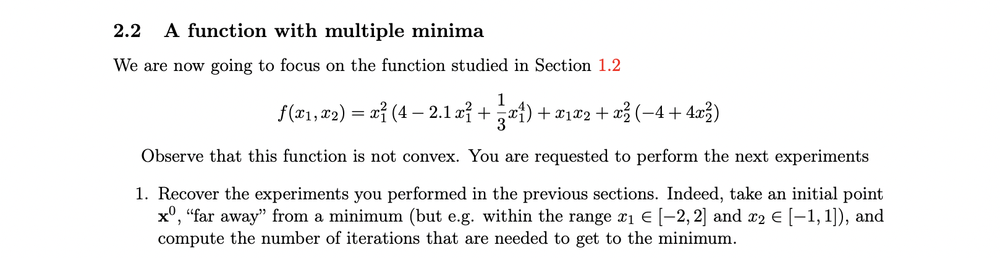

**Initialization**

In [50]:
import matplotlib.pyplot as plt
import numpy as np
plt.style.use('seaborn-white')

# Defining the function --------------------------------------------------------
def f_aux(x1, x2):
  res = (x1**2)*(4-2.1*(x1**2) + 1/3*(x1**4)) + x1*x2 + (x2**2)*(-4+4*(x2**2))
  return res

def f(x):
  res = (x[0]**2)*(4-2.1*(x[0]**2) + 1/3*(x[0]**4)) + x[0]*x[1] + (x[1]**2)*(-4+4*(x[1]**2))
  return res

# Defining the gradient of the function ----------------------------------------
def gradient_f(x):
  grad = np.zeros([2,1])
  grad[0] = 8*x[0]-8.4*(x[0]**3)+2*(x[0]**5)+x[1]
  grad[1] = x[0]-8*x[1]+16*(x[1]**3)
  return grad

# Defining the Hessian of the function -----------------------------------------
def hessian_f(x):
  H = np.zeros([2,2])
  H[0,0] = 8 - 25.2*x[0]**2 + 10*x[0]**4
  H[0,1] = 1
  H[1,0] = 1
  H[1,1] = -8 + 48*x[1]**2
  return H

**Visualize the function**

/usr/local/lib/python3.7/dist-packages/mpl_toolkits/mplot3d/art3d.py:304: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  self._segments3d = np.asanyarray(segments)


Text(0.5, 0, 'z')

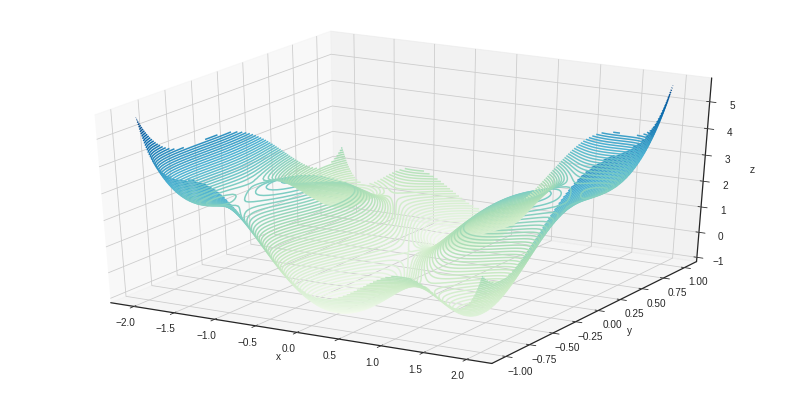

In [51]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('seaborn-white')

xlim = 2
ylim = 1

x = np.linspace(-xlim, xlim, 100)      
y = np.linspace(-ylim, ylim, 100)

X, Y = np.meshgrid(x, y)
Z = f_aux(X, Y)

fig = plt.figure(figsize=(14, 7))
ax = plt.axes(projection='3d')
ax.contour3D(X, Y, Z, 100, cmap='GnBu')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')

**Definition of the gradient descent method and the Newton method**

In [52]:
# Defining the gradient descent method -----------------------------------------
def grad_des_improv(x0, tol):     # Defining a gradient descent method with a non-constant step size
  """ Gradient descent method
  Direction of descent: steepest, alpha: adjusted
  Returns xk (2xk+1), k (number of iterations)
  """

  xk = np.zeros([2,1])
  xk[:,[0]] = x0
  k = 0
  grad = np.ones([2,1])                  # Used to initialize the loop, its actual value gets computed as soon as the while loop begins
  while np.sqrt(grad[0]**2+grad[1]**2)>tol:
    grad = gradient_f(xk[:,[k]])
    alpha = 1                       # Initial value of alpha
    xk = np.append(xk, xk[:,[k]] - alpha*grad, axis=1)
    while f(xk[:,[k+1]])>f(xk[:,[k]]):            # Backtracking algorithm to adjust alpha_k
      alpha = alpha/2           # Update alpha
      xk[:,[k+1]] = xk[:,[k]] - alpha*grad        # Compute xk+1 once again and check if the value of the function has decreased

    k = k+1

  return xk, k

# Defining the Newton method ---------------------------------------------------
def newton(x0, tol):     # Defining a gradient descent method with a non-constant step size
  """ Newton method
  Direction of descent: newton direction, alpha: adjusted
  Returns xk (2xk+1), k (number of iterations)
  """

  xk = np.zeros([2,1])
  xk[:,[0]] = x0
  k = 0
  grad = np.ones([2,1])                  # Used to initialize the loop, its actual value gets computed as soon as the while loop begins
  while np.sqrt(grad[0]**2+grad[1]**2)>tol:
    grad = gradient_f(xk[:,[k]])
    H = hessian_f(xk[:,[k]])
    alpha = 1                       # Initial value of alpha
    dk = np.linalg.solve(H, grad)
    xk = np.append(xk, xk[:,[k]] - alpha*dk, axis=1)
    while f(xk[:,[k+1]])>f(xk[:,[k]]):            # Backtracking algorithm to adjust alpha_k
      alpha = alpha/2           # Update alpha
      xk[:,[k+1]] = xk[:,[k]] - alpha*dk        # Compute xk+1 once again and check if the value of the function has decreased
      if alpha<tol*1e-2:                    # Adding a stop condition that returns an error if f_k+1>f_k even when alpha is really small
        return "ERROR: Newton forced to terminate, dk is not a descent direction", "ERROR" 

    k = k+1
 
  return xk, k    

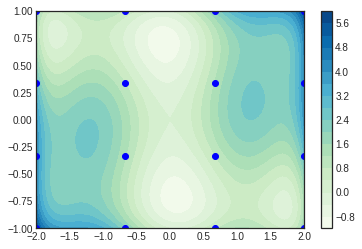

In [53]:
# Defining some parameters -----------------------------------------------------
tol = 1e-5

xlim = 2
ylim = 1

x = np.linspace(-xlim, xlim, 100)      
y = np.linspace(-ylim, ylim, 100)

X, Y = np.meshgrid(x, y)
Z = f_aux(X, Y)

# Generating some initial values -----------------------------------------------
N = 4
x1_zeros = np.linspace(-xlim, xlim, N)
x2_zeros = np.linspace(-ylim, ylim, N)
x_zeros = np.zeros([2, N*N])        # making a 2x16 vector with the coordinates of some points to use as x0
for i in range(0,N):
  for j in range(0,N):
    x_zeros[0,i+j+i*(N-1)] = x1_zeros[i]
    x_zeros[1,i+j+i*(N-1)] = x2_zeros[j]

# Plotting the function and the initial values ---------------------------------
plt.figure()
plt.contourf(X, Y, Z, 20, cmap='GnBu')
plt.colorbar();
plt.xlim([-xlim, xlim])
plt.ylim([-ylim, ylim])
plt.scatter(x_zeros[0], x_zeros[1], c='b')  # From now on we'll plot the inital values in blue since red will be used for the gradient descent path

**For different initial values in the range [-2,2], [-1,1], visualize the performance of the gradient descent method and the Newton method**

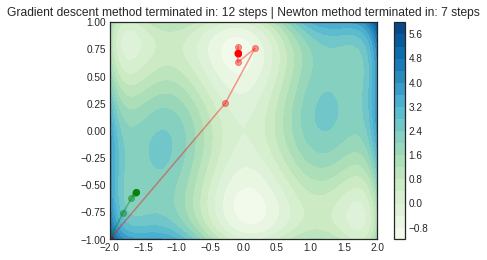

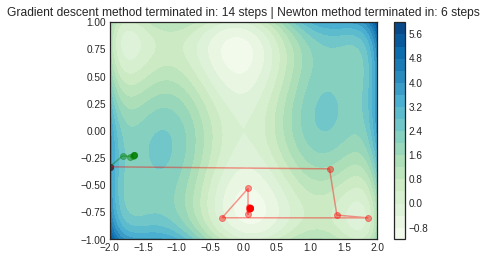

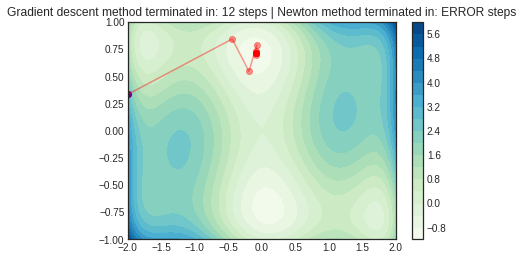

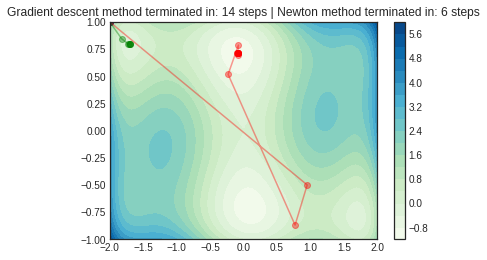

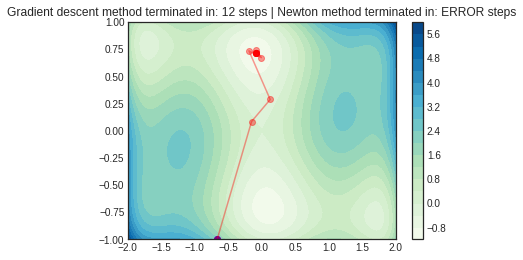

...

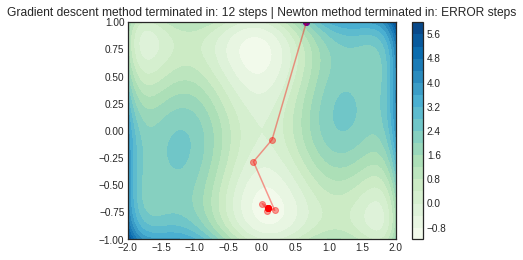

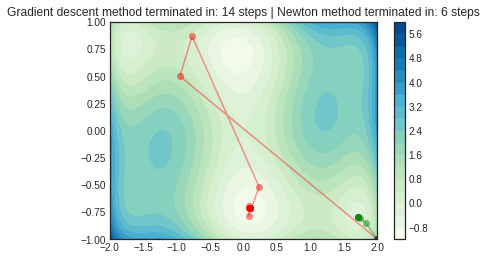

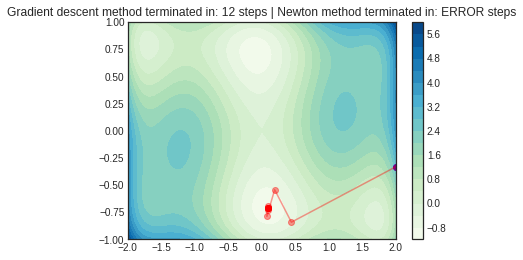

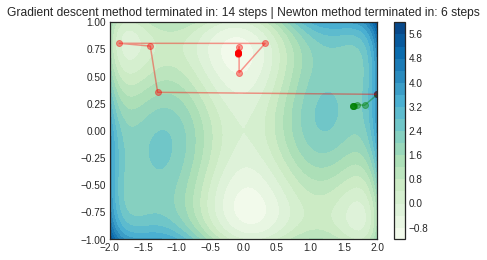

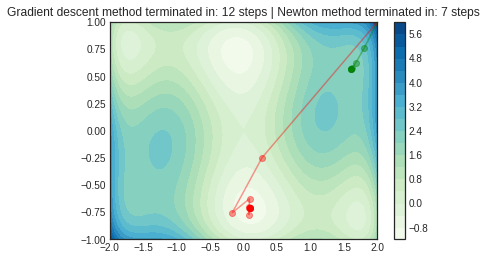

In [54]:
# Running the descent method on the computed initial values --------------------
for i in range(0, N*N):
  plt.figure()
  plt.contourf(X, Y, Z, 20, cmap='GnBu')
  plt.colorbar();
  plt.xlim([-xlim, xlim])
  plt.ylim([-ylim, ylim])
  plt.scatter(x_zeros[0,[i]], x_zeros[1,[i]], c='b')  # From now on we'll plot the inital values in blue since red will be used for the gradient descent path

  xk1, k1 = grad_des_improv(x_zeros[:,[i]], tol)      # GRADIENT DESCENT
  plt.plot(xk1[0], xk1[1], c='r', alpha=0.4)        # Plotting the path of the xk
  plt.scatter(xk1[0], xk1[1], c='r', alpha=0.4)     # Scattering points at each step k

  xk2, k2 = newton(x_zeros[:,[i]], tol)     # NEWTON
  if k2!="ERROR":
    plt.plot(xk2[0], xk2[1], c='g', alpha=0.4)        # Plotting the path of the xk
    plt.scatter(xk2[0], xk2[1], c='g', alpha=0.4)     # Scattering points at each step k
  plt.title("Gradient descent method terminated in: " + str(k1) + " steps" + " | " + "Newton method terminated in: " + str(k2) + " steps")

OBSERVATIONS: 
- As we can see, for some initial values the Newton method does not converge to a minimum, but when it converges it does so faster than the gradient descent method. (It converges when it's close enough to a minimum and it converges to said minimum)
- Newthon converges when the initial value chosen is close enough to a minimum for the function to be locally convex. When this does not happen, the Newthon method ends up computing a direction dk which is not a direction of descent

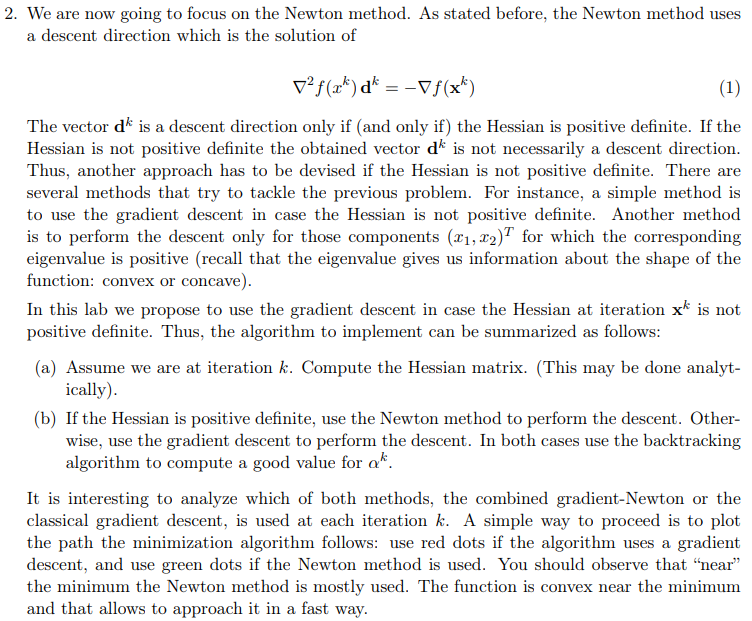

**Defining a Gradient-Newton method; from here on we'll refer to this method either as newton_gen, for generalized, or as a non-local Newton method, since it makes use of the gradient descent method when far away from the minimum**

In [55]:
# Defining a non-local Newton method -------------------------------------------
def newton_gen(x0, tol):     # Defining a gradient descent method with a non-constant step size
  """ Gradient-Newton method 
  Direction of descent: newton direction, alpha: adjusted
  Returns xk (2xk+1), k (number of iterations)
  """

  xk = np.zeros([2,1])
  xk[:,[0]] = x0
  k = 0
  grad = np.ones([2,1])                  # Used to initialize the loop, its actual value gets computed as soon as the while loop begins
  c = "k"                 # Initialize the color vector with k, the first point is already plotted, so it won't plot it again for i=0
  while np.sqrt(grad[0]**2+grad[1]**2)>tol:
    grad = gradient_f(xk[:,[k]])
    H = hessian_f(xk[:,[k]])
    eig = np.linalg.eigvals(H)
    alpha = 1                       # Initial value of alpha

    if all(i>0 for i in eig):         # H is positive definite: run Newton method
      c = np.append(c, "g")
      dk = np.linalg.solve(H, grad)
      xk = np.append(xk, xk[:,[k]] - alpha*dk, axis=1)
      while f(xk[:,[k+1]])>f(xk[:,[k]]):            # Backtracking algorithm to adjust alpha_k
        alpha = alpha/2           # Update alpha
        xk[:,[k+1]] = xk[:,[k]] - alpha*dk        # Compute xk+1 once again and check if the value of the function has decreased

    else:                             # H is not positive definite: run gradient descent method
      c = np.append(c, "r")
      xk = np.append(xk, xk[:,[k]] - alpha*grad, axis=1)
      while f(xk[:,[k+1]])>f(xk[:,[k]]):            # Backtracking algorithm to adjust alpha_k
        alpha = alpha/2           # Update alpha
        xk[:,[k+1]] = xk[:,[k]] - alpha*grad        # Compute xk+1 once again and check if the value of the function has decreased

    k = k+1
 
  return xk, k, c    

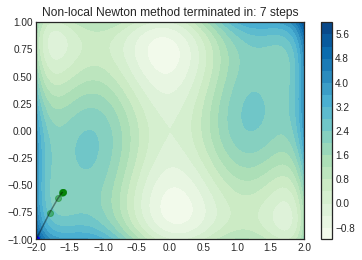

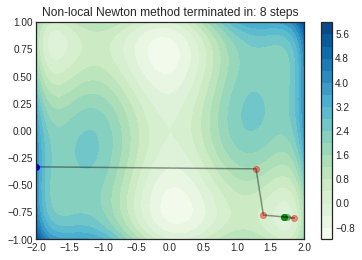

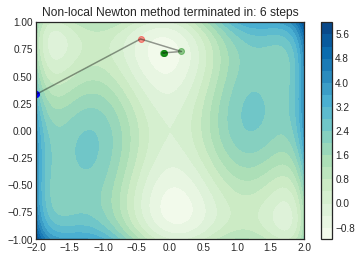

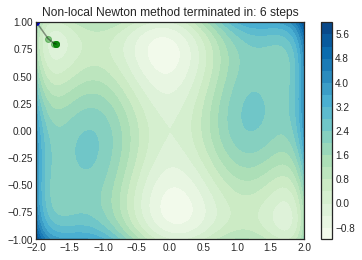

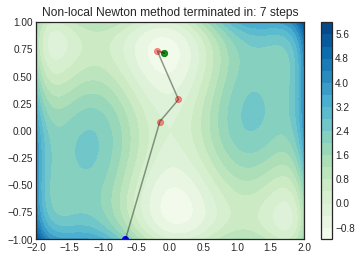

...

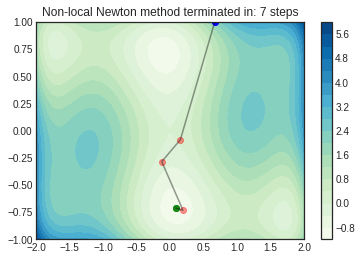

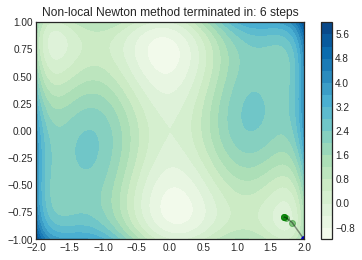

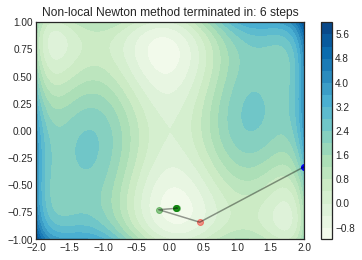

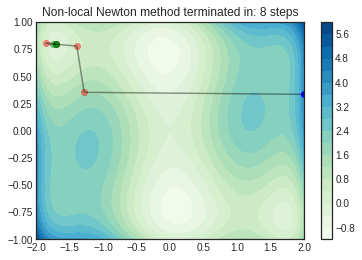

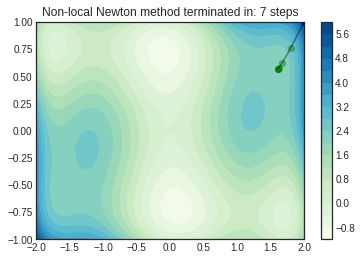

In [56]:
# Running the descent method on the computed initial values --------------------
for i in range(0, N*N):
  plt.figure()
  plt.contourf(X, Y, Z, 20, cmap='GnBu')
  plt.colorbar();
  plt.xlim([-xlim, xlim])
  plt.ylim([-ylim, ylim])
  plt.scatter(x_zeros[0,[i]], x_zeros[1,[i]], c='b')  # From now on we'll plot the inital values in blue since red will be used for the gradient descent path

  xk, k, c = newton_gen(x_zeros[:,[i]], tol)      # GRADIENT DESCENT
  plt.plot(xk[0], xk[1], c='k', alpha=0.4)        # Plotting the path of the xk
  for i in range(0, xk.shape[1]):        # Scattering the points of each step with different colors
    if c[i]=="g":
      plt.scatter(xk[0,[i]], xk[1,[i]], c='g', alpha=0.4)     # Scattering points at each step k
    if c[i]=="r":
      plt.scatter(xk[0,[i]], xk[1,[i]], c='r', alpha=0.4)     # Scattering points at each step k
  plt.title("Non-local Newton method terminated in: " + str(k) + " steps")

OBSERVATIONS: </br>
- As expected, further away from the minimum, the method uses gradient descent in order to compute x_k+1, while close to the minimum the Newton method's direction of descent is optimal. 
- Furthermore, the number of steps is reduced compared to the gradient descent method previously used, and the method doesn't fail with some initial values like the Newton method previously did.

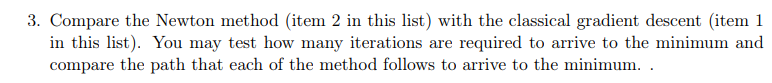

**Comparing the behaviour of this method and the gradient descent method**

Numer of steps for the different initial values with the Gradient descent method: 
[12. 14. 12. 14. 12.  9. 13. 11. 11. 13.  9. 12. 14. 12. 14. 12.]
Numer of steps for the different initial values with the non-local Newthon method: 
[7. 8. 6. 6. 7. 5. 6. 6. 6. 6. 5. 7. 6. 6. 8. 7.]


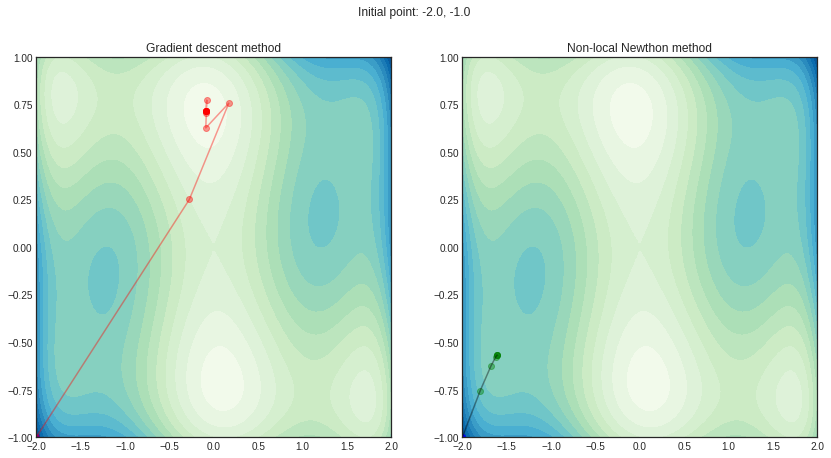

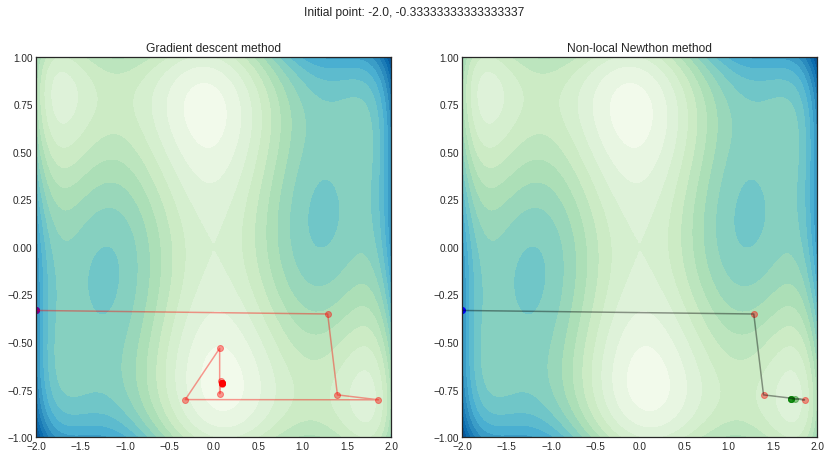

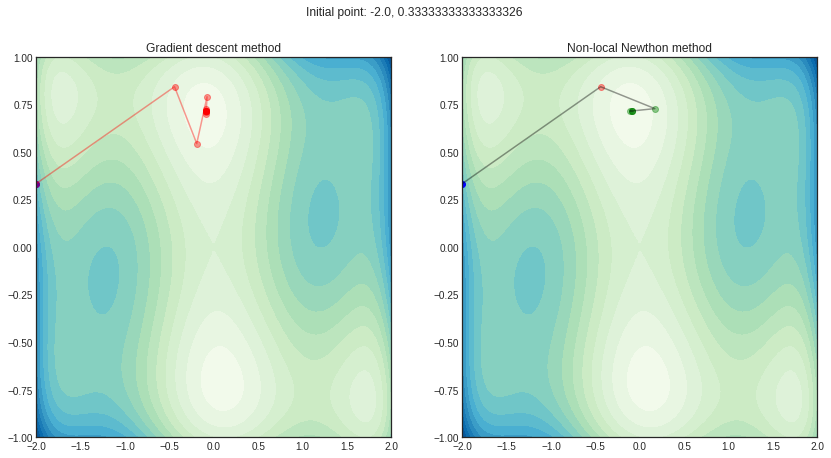

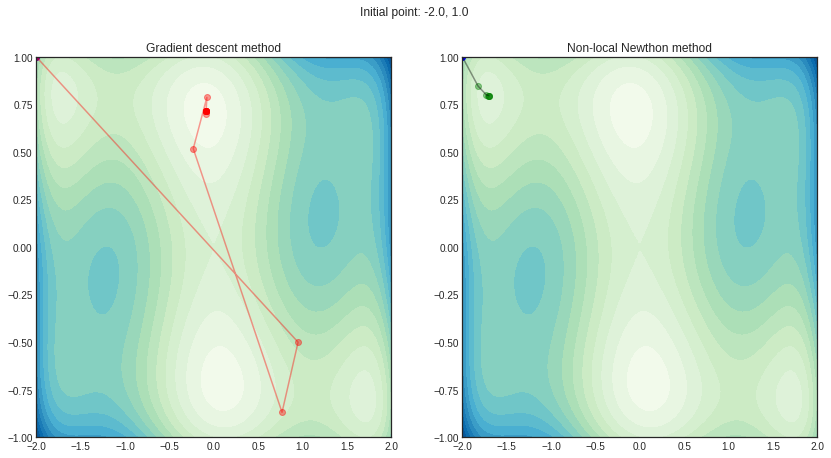

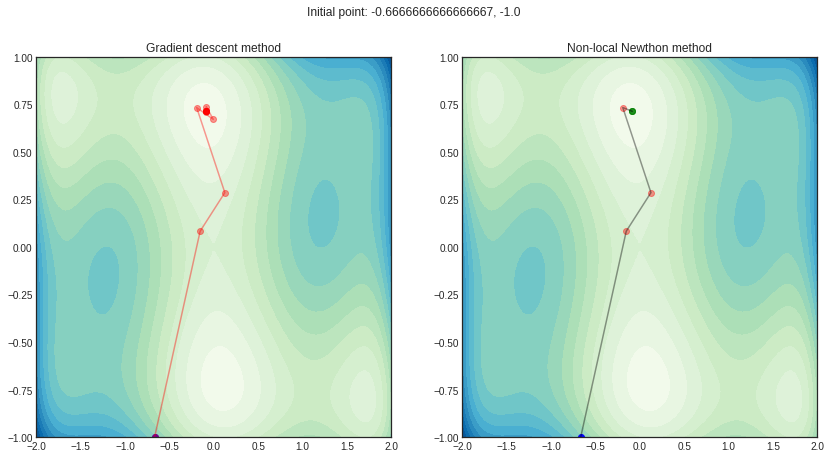

...

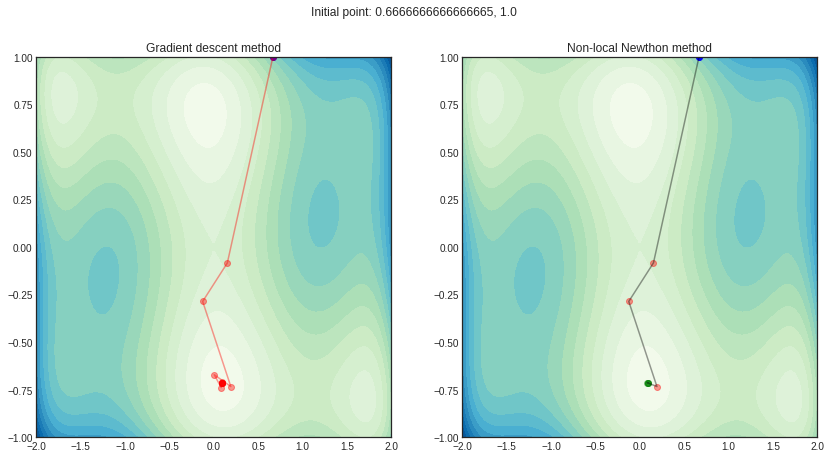

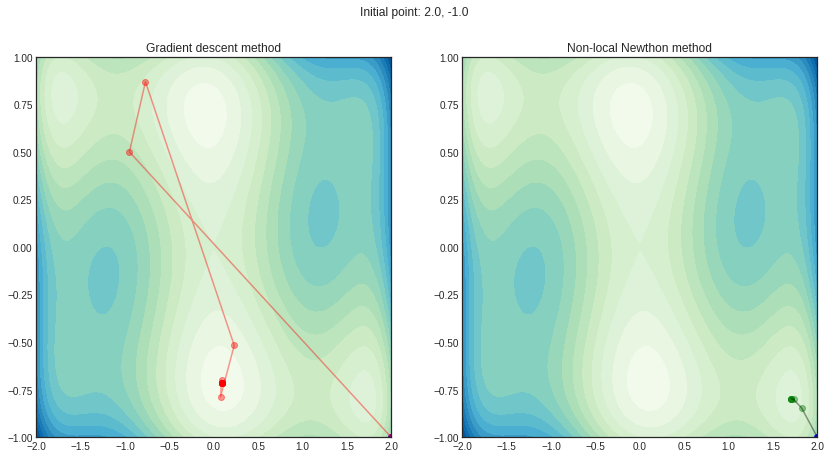

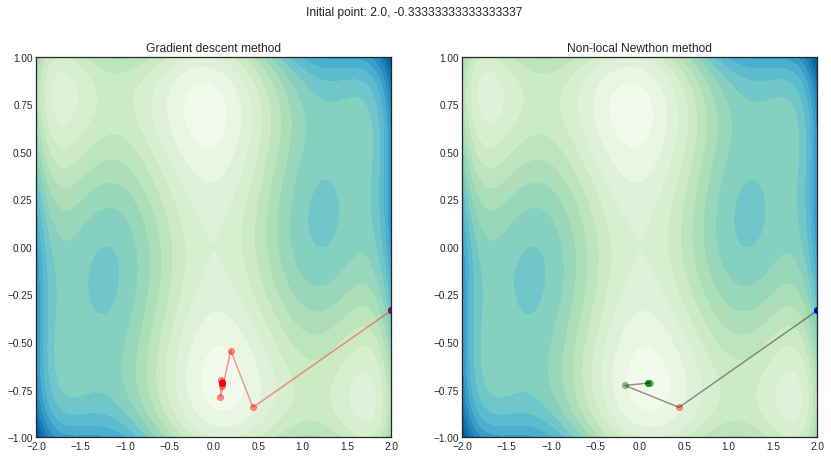

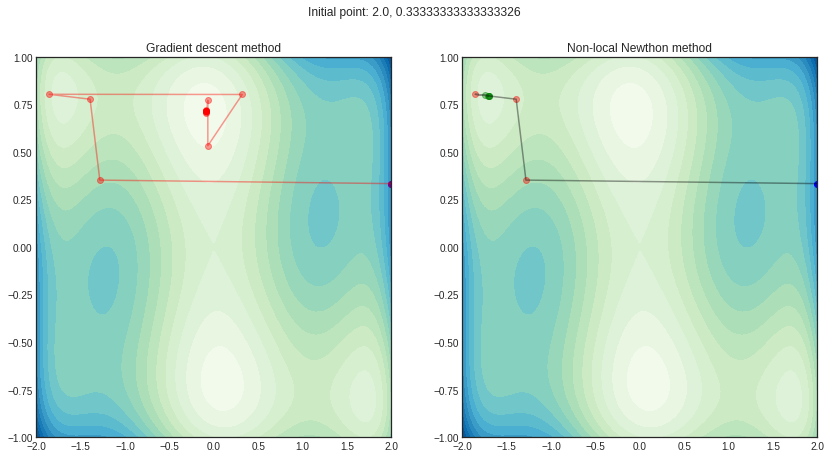

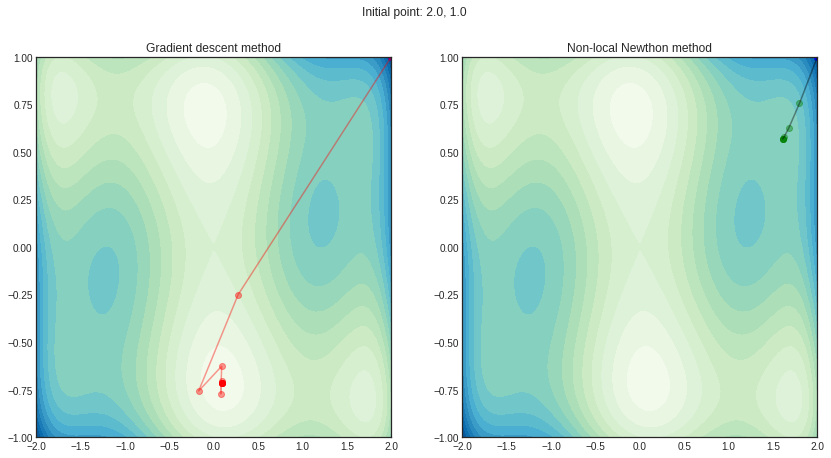

In [57]:
# Initializing an array to hold the number of steps ----------------------------
K = np.ones([2,N*N])

# Initializing the plots -------------------------------------------------------
for i in range(0, N*N):
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))
  fig.suptitle('Initial point: ' + str(x_zeros[0,i]) + ", " + str(x_zeros[1,i]))
  ax1.contourf(X, Y, Z, 20, cmap='GnBu')
  ax1.set_xlim([-xlim, xlim])
  ax1.set_ylim([-ylim, ylim])
  ax1.scatter(x_zeros[0,[i]], x_zeros[1,[i]], c='b')  
  ax1.set_title('Gradient descent method')

  ax2.contourf(X, Y, Z, 20, cmap='GnBu')
  ax2.set_xlim([-xlim, xlim])
  ax2.set_ylim([-ylim, ylim])
  ax2.scatter(x_zeros[0,[i]], x_zeros[1,[i]], c='b')  
  ax2.set_title('Non-local Newthon method')

# Running the methods and plotting the behavious -------------------------------
  xk1, k1 = grad_des_improv(x_zeros[:,[i]], tol)      # GRADIENT DESCENT
  K[0,i] = k1       # Storing the number of steps
  ax1.plot(xk1[0], xk1[1], c='r', alpha=0.4)        # Plotting the path of the xk
  ax1.scatter(xk1[0], xk1[1], c='r', alpha=0.4)     # Scattering points at each step k

  xk2, k2, c = newton_gen(x_zeros[:,[i]], tol)      # NON-LOCAL NEWTHON METHOD
  K[1,i] = k2       # Storing the number of steps
  ax2.plot(xk2[0], xk2[1], c='k', alpha=0.4)        # Plotting the path of the xk
  for i in range(0, xk2.shape[1]):        # Scattering the points of each step with different colors
    if c[i]=="g":
      plt.scatter(xk2[0,[i]], xk2[1,[i]], c='g', alpha=0.4)     # Scattering points at each step k
    if c[i]=="r":
      plt.scatter(xk2[0,[i]], xk2[1,[i]], c='r', alpha=0.4)     # Scattering points at each step k

# Comparing the number of steps
print("Numer of steps for the different initial values with the Gradient descent method: ")
print(K[0])
print("Numer of steps for the different initial values with the non-local Newthon method: ")
print(K[1])

OBSERVATIONS:</br>
- The paths sometimes are similar, while sometimes they reach completely different minima. 
- In general, the non-local Newthon methods requires less steps, as we were expecting since it is optimized with the use of the Newthon direction when close to the solution. (where the function is locally convex)

# **Ex.2 - Newton descent method | 2.3 The Rosenbrock function**

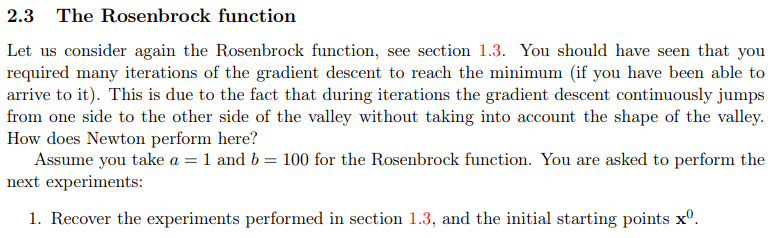

**Visualize the function**

/usr/local/lib/python3.7/dist-packages/mpl_toolkits/mplot3d/art3d.py:304: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  self._segments3d = np.asanyarray(segments)


Text(0.5, 0, 'z')

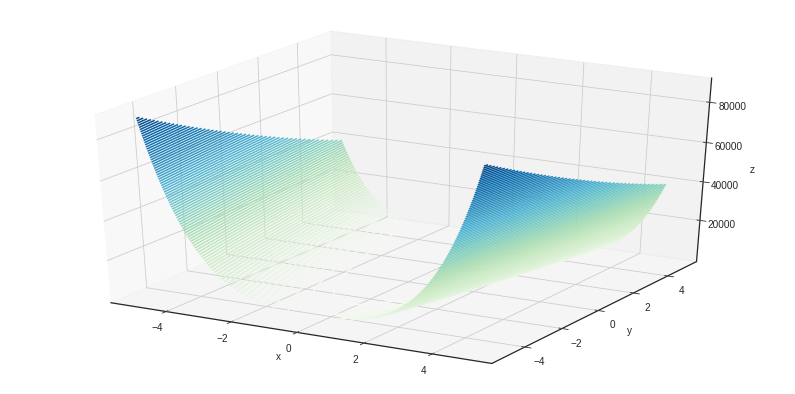

In [58]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('seaborn-white')

# Define the Rosenbrock function -----------------------------------------------
def f(x, a=1, b=100):
  res = ((a-x[0])**2 + b*((x[1]-(x[0]**2))**2))
  return res

def f_aux(x1, x2, a=1, b=100):
  res = ((a-x1)**2)+b*((x2-(x1**2))**2)
  return res

# Visualize the function -------------------------------------------------------
xlim = 5
ylim= 5

x1 = np.linspace(-xlim, xlim, 100)
x2 = np.linspace(-ylim, ylim, 100)

X1, X2 = np.meshgrid(x1, x2)
Z = f_aux(X1, X2)

fig = plt.figure(figsize=(14, 7))
ax = plt.axes(projection='3d')
ax.contour3D(X1, X2, Z, 100, cmap='GnBu')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')

(-5.0, 5.0)

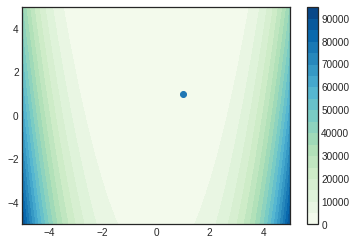

In [59]:
# Plot the Rosenbrock function with a=1, b=100 ---------------------------------
# In this case the minimum will be at (1,1)

plt.contourf(X1, X2, Z, 20, cmap='GnBu')
plt.colorbar();
plt.scatter(1,1)
plt.xlim([-xlim, xlim])
plt.ylim([-ylim,ylim])

In [60]:
# Define the corresponding gradient function of f(x) ---------------------------
def gradient_f(x, a=1, b=100):
  grad = np.zeros([2,1])
  grad[0] = 4*b*(x[0]**3)+2*x[0]*(1-2*b*x[1])-2*a
  grad[1] = 2*b*(x[1]-(x[0]**2))
  return grad

# Define the Hessian function of f(x) ------------------------------------------
def hessian_f(x, a=1, b=100):
  H = np.zeros([2,2])
  H[0,0] = 12*b*(x[0]**2) + 2*(1-2*b*x[1])
  H[0,1] = -4*b*x[0]
  H[1,0] = -4*b*x[0]
  H[1,1] = 2*b
  return H

# Define the gradient descent method -------------------------------------------
def grad_des_improv(x0, tol, a=1, b=100):     # Defining a gradient descent method with a non-constant step size
  """ Gradient descent method
  Direction of descent: steepest, alpha: adjusted
  Returns xk (2xk+1), k (number of iterations)
  """

  xk = np.zeros([2,1])
  xk[:,[0]] = x0
  k = 0
  grad = np.ones([2,1])                  # Used to initialize the loop, its actual value gets computed as soon as the while loop begins
  while np.sqrt(grad[0]**2+grad[1]**2)>tol:
    grad = gradient_f(xk[:,[k]], a, b)
    alpha = 1                       # Initial value of alpha
    xk = np.append(xk, xk[:,[k]] - alpha*grad, axis=1)
    while f(xk[:,[k+1]], a, b) > f(xk[:,[k]], a, b):
      alpha = alpha/2           # Update alpha
      xk[:,[k+1]] = xk[:,[k]] - alpha*grad       # Compute xk+1 once again and check if the value of the function has decreased

    k = k+1

  return xk, k

**DISCLAIMER: Run this following block only in case of need: it's time demanding to compute**

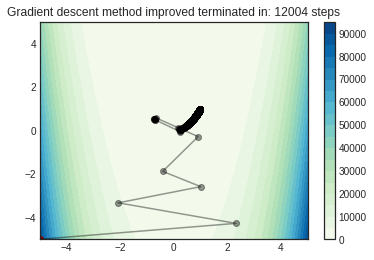

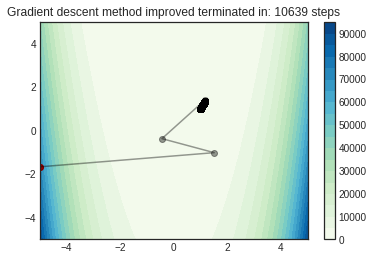

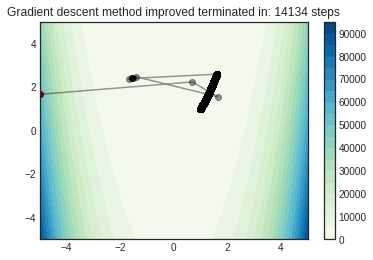

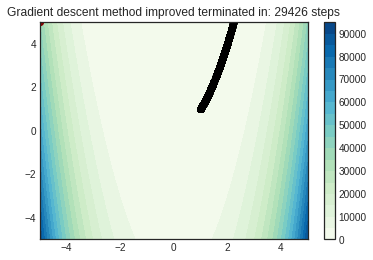

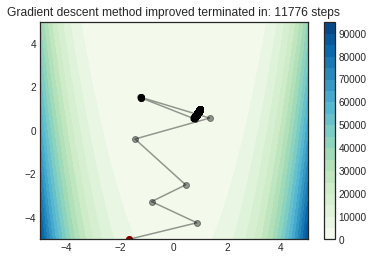

...

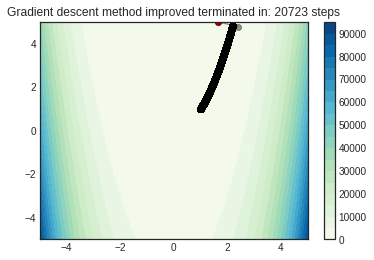

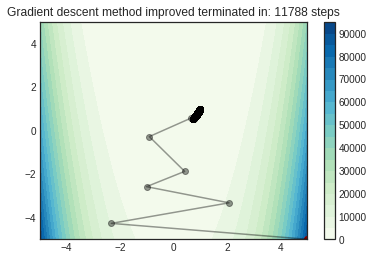

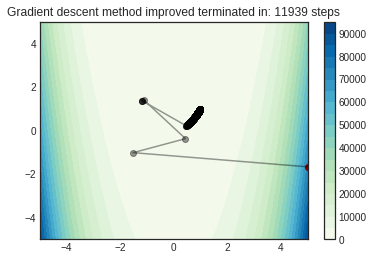

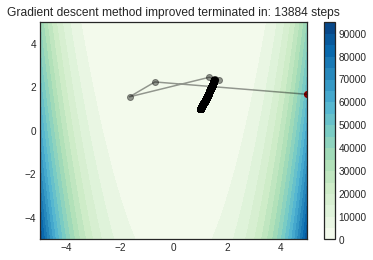

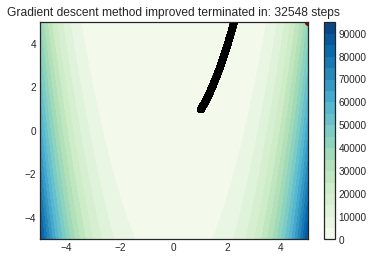

In [61]:
# Define the parameters to plot Rosenbrock function with a=1, b=100 ------------
# In this case the minimum will be at (1,1)
xlim = 5
ylim= 5

a=1
b=100

x1 = np.linspace(-xlim, xlim, 100)
x2 = np.linspace(-ylim, ylim, 100)

# Computing some intial values x0 and plotting them ----------------------------
N = 4
x1_zeros = np.linspace(-xlim, xlim, N)
x2_zeros = np.linspace(-ylim, ylim, N)
x_zeros = np.zeros([2, N*N])        # making a 2x16 vector with the coordinates of some points to use as x0
for i in range(0,N):
  for j in range(0,N):
    x_zeros[0,i+j+i*(N-1)] = x1_zeros[i]
    x_zeros[1,i+j+i*(N-1)] = x2_zeros[j]

# Running the descent method on the computed initial values --------------------
tol = 1e-5

for i in range(0, N*N):
  X1, X2 = np.meshgrid(x1, x2)
  Z = f_aux(X1, X2, a, b)

  plt.figure()
  plt.contourf(X1, X2, Z, 20, cmap='GnBu')
  plt.colorbar();
  plt.xlim([-xlim, xlim])
  plt.ylim([-ylim,ylim])
  plt.scatter(x_zeros[0,[i]], x_zeros[1,[i]], c='r')

  xk, k = grad_des_improv(x_zeros[:,[i]], tol)
  plt.title("Gradient descent method improved terminated in: " + str(k) + " steps")
  plt.plot(xk[0], xk[1], c='k', alpha=0.4)        # Plotting the path of the xk
  plt.scatter(xk[0], xk[1], c='k', alpha=0.4)     # Scattering points at each step k

OBSERVATION: here the same observations given in section 1.3 regarding the gradient descent method still hold

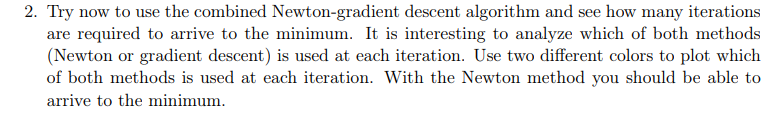

In [62]:
# Defining a non-local Newton method -------------------------------------------
def newton_gen(x0, tol, a=1, b=100):     # Defining a gradient descent method with a non-constant step size
  """ Newton method
  Direction of descent: newton direction, alpha: adjusted
  Returns xk (2xk+1), k (number of iterations)
  """

  xk = np.zeros([2,1])
  xk[:,[0]] = x0
  k = 0
  grad = np.ones([2,1])                  # Used to initialize the loop, its actual value gets computed as soon as the while loop begins
  c = "k"                 # Initialize the color vector with k, the first point is already plotted, so it won't plot it again for i=0
  while np.sqrt(grad[0]**2+grad[1]**2)>tol:
    grad = gradient_f(xk[:,[k]], a, b)
    H = hessian_f(xk[:,[k]], a, b)
    eig = np.linalg.eigvals(H)
    alpha = 1                       # Initial value of alpha

    if all(i>0 for i in eig):         # H is positive definite: run Newton method
      c = np.append(c, "g")
      dk = np.linalg.solve(H, grad)
      xk = np.append(xk, xk[:,[k]] - alpha*dk, axis=1)
      while f(xk[:,[k+1]], a, b)>f(xk[:,[k]], a, b):            # Backtracking algorithm to adjust alpha_k
        alpha = alpha/2           # Update alpha
        xk[:,[k+1]] = xk[:,[k]] - alpha*dk        # Compute xk+1 once again and check if the value of the function has decreased

    else:                             # H is not positive definite: run gradient descent method
      c = np.append(c, "r")
      xk = np.append(xk, xk[:,[k]] - alpha*grad, axis=1)
      while f(xk[:,[k+1]], a, b)>f(xk[:,[k]], a, b):            # Backtracking algorithm to adjust alpha_k
        alpha = alpha/2           # Update alpha
        xk[:,[k+1]] = xk[:,[k]] - alpha*grad        # Compute xk+1 once again and check if the value of the function has decreased

    k = k+1
 
  return xk, k, c   

**DISCLAIMER: Run this following block only in case of need: it's time demanding to compute. It is repeated after these blocks including a stop condition on the number of iterations, which takes considerably less time**

Numer of steps for the different initial values with the Gradient descent method: 
[12004. 10639. 14134. 29426. 11776. 11826. 14037. 21782. 11404. 10855.
 14636. 20723. 11788. 11939. 13884. 32548.]
Numer of steps for the different initial values with the non-local Newthon method: 
[37. 37. 37. 37. 24. 23. 24. 28. 13. 13. 13. 18. 29. 30. 29. 30.]


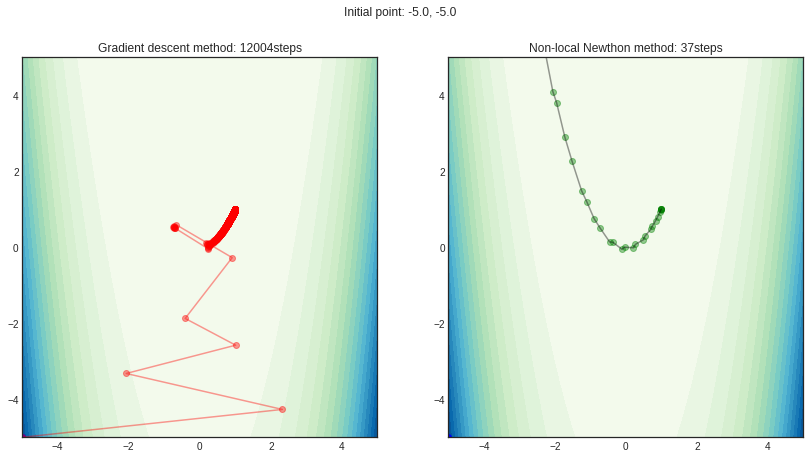

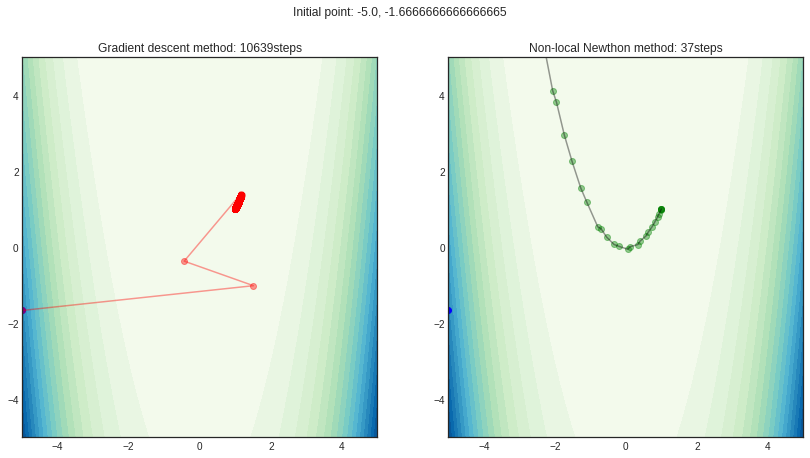

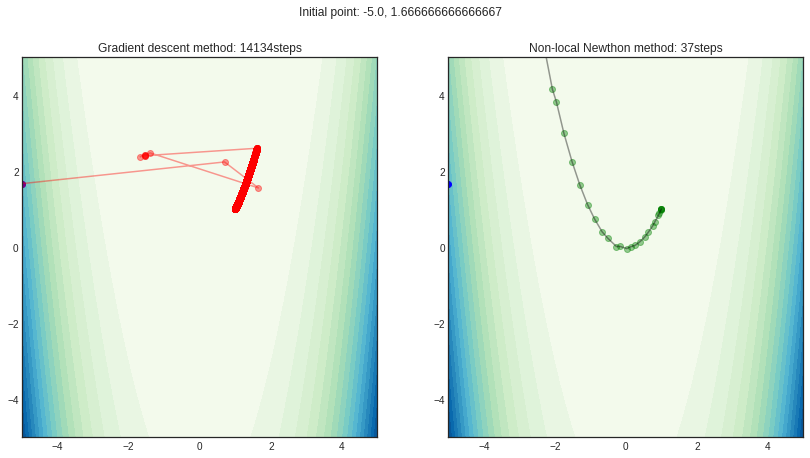

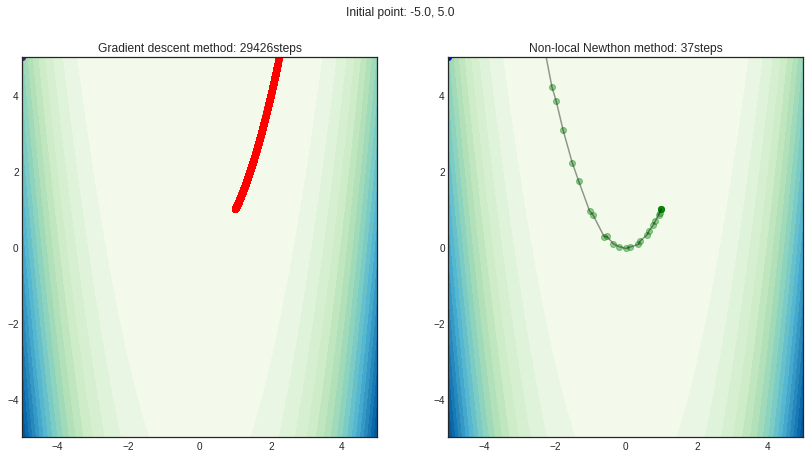

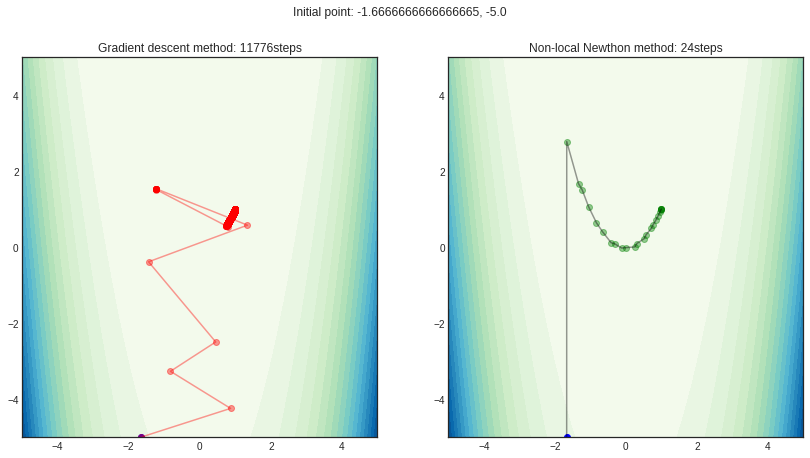

...

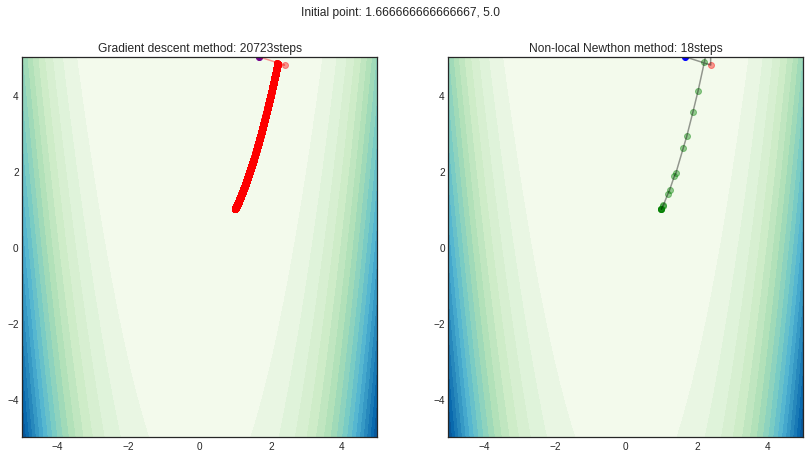

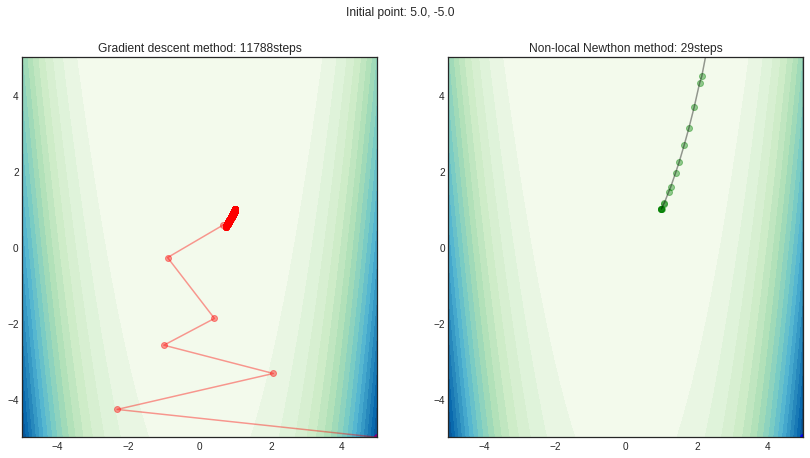

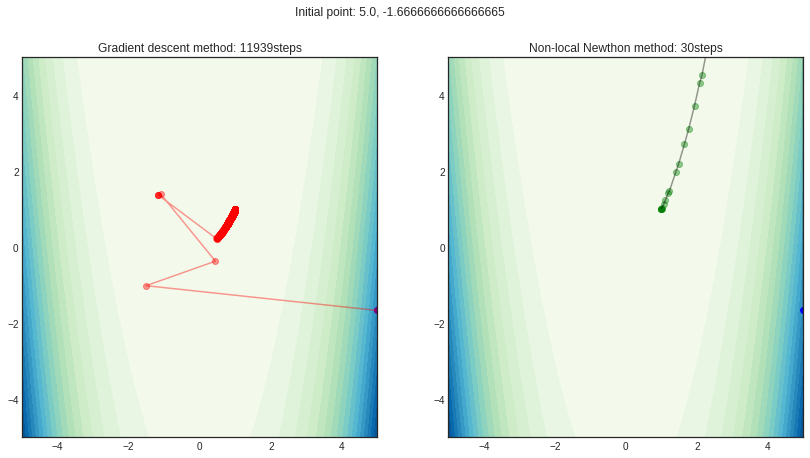

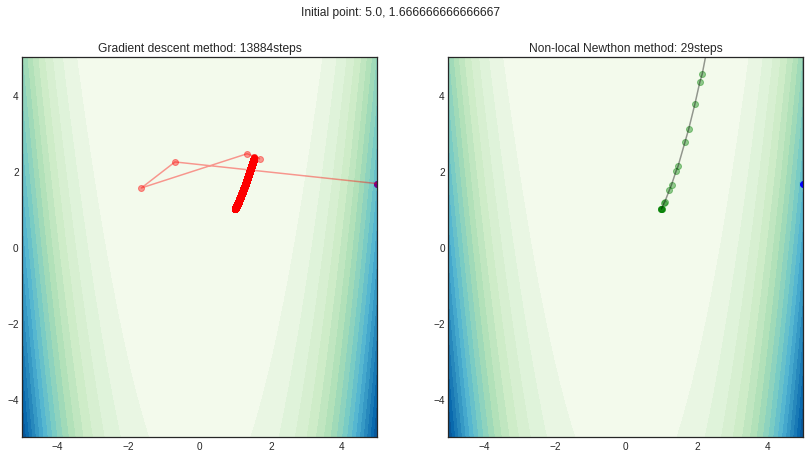

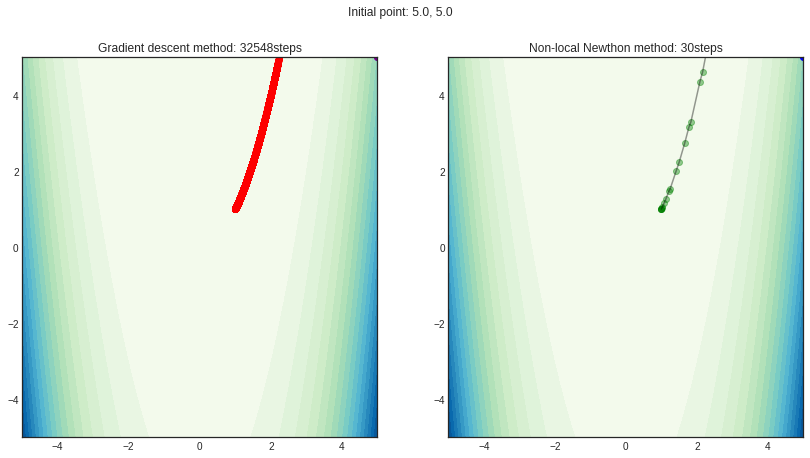

In [63]:
# Initializing an array to hold the number of steps ----------------------------
K = np.ones([2,N*N])

x1 = np.linspace(-xlim, xlim, 100)
x2 = np.linspace(-ylim, ylim, 100)

X1, X2 = np.meshgrid(x1, x2)
Z = f_aux(X1, X2, a, b)

# Initializing the plots -------------------------------------------------------
for i in range(0, N*N):
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))
  fig.suptitle('Initial point: ' + str(x_zeros[0,i]) + ", " + str(x_zeros[1,i]))
  ax1.contourf(X1, X2, Z, 20, cmap='GnBu')
  ax1.set_xlim([-xlim, xlim])
  ax1.set_ylim([-ylim, ylim])
  ax1.scatter(x_zeros[0,[i]], x_zeros[1,[i]], c='b')  

  ax2.contourf(X1, X2, Z, 20, cmap='GnBu')
  ax2.set_xlim([-xlim, xlim])
  ax2.set_ylim([-ylim, ylim])
  ax2.scatter(x_zeros[0,[i]], x_zeros[1,[i]], c='b')  

# Running the methods and plotting the behavious -------------------------------
  xk1, k1 = grad_des_improv(x_zeros[:,[i]], tol)      # GRADIENT DESCENT
  K[0,i] = k1       # Storing the number of steps
  ax1.plot(xk1[0], xk1[1], c='r', alpha=0.4)        # Plotting the path of the xk
  ax1.scatter(xk1[0], xk1[1], c='r', alpha=0.4)     # Scattering points at each step k
  ax1.set_title("Gradient descent method: " + str(k1) + "steps")

  xk2, k2, c = newton_gen(x_zeros[:,[i]], tol)      # NON-LOCAL NEWTHON METHOD
  K[1,i] = k2       # Storing the number of steps
  ax2.plot(xk2[0], xk2[1], c='k', alpha=0.4)        # Plotting the path of the xk
  for i in range(0, xk2.shape[1]):        # Scattering the points of each step with different colors
    if c[i]=="g":
      plt.scatter(xk2[0,[i]], xk2[1,[i]], c='g', alpha=0.4)     # Scattering points at each step k
    if c[i]=="r":
      plt.scatter(xk2[0,[i]], xk2[1,[i]], c='r', alpha=0.4)     # Scattering points at each step k
  ax2.set_title("Non-local Newthon method: " + str(k2) + "steps")

# Comparing the number of steps
print("Numer of steps for the different initial values with the Gradient descent method: ")
print(K[0])
print("Numer of steps for the different initial values with the non-local Newthon method: ")
print(K[1])

**Adding a stop condition on the gradient method for the number of iterations**

In [64]:
# Define the gradient descent method -------------------------------------------
def grad_des_improv(x0, tol, a=1, b=100):     # Defining a gradient descent method with a non-constant step size
  """ Gradient descent method
  Direction of descent: steepest, alpha: adjusted
  Returns xk (2xk+1), k (number of iterations)
  """

  xk = np.zeros([2,1])
  xk[:,[0]] = x0
  k = 0
  grad = np.ones([2,1])                  # Used to initialize the loop, its actual value gets computed as soon as the while loop begins
  while np.sqrt(grad[0]**2+grad[1]**2)>tol:
    grad = gradient_f(xk[:,[k]], a, b)
    alpha = 1                       # Initial value of alpha
    xk = np.append(xk, xk[:,[k]] - alpha*grad, axis=1)
    while f(xk[:,[k+1]], a, b) > f(xk[:,[k]], a, b):
      alpha = alpha/2           # Update alpha
      xk[:,[k+1]] = xk[:,[k]] - alpha*grad       # Compute xk+1 once again and check if the value of the function has decreased

    k = k+1

    if k >= 2000:
      return xk, k

  return xk, k

Numer of steps for the different initial values with the Gradient descent method: 
[2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000.]
Numer of steps for the different initial values with the non-local Newthon method: 
[37. 37. 37. 37. 24. 23. 24. 28. 13. 13. 13. 18. 29. 30. 29. 30.]


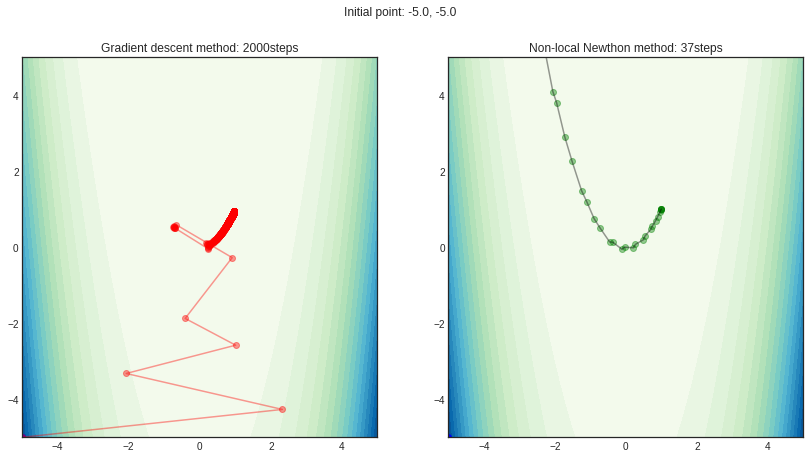

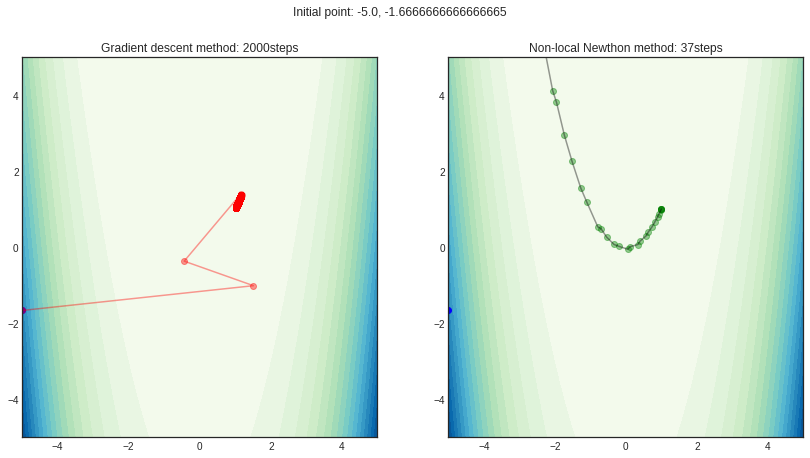

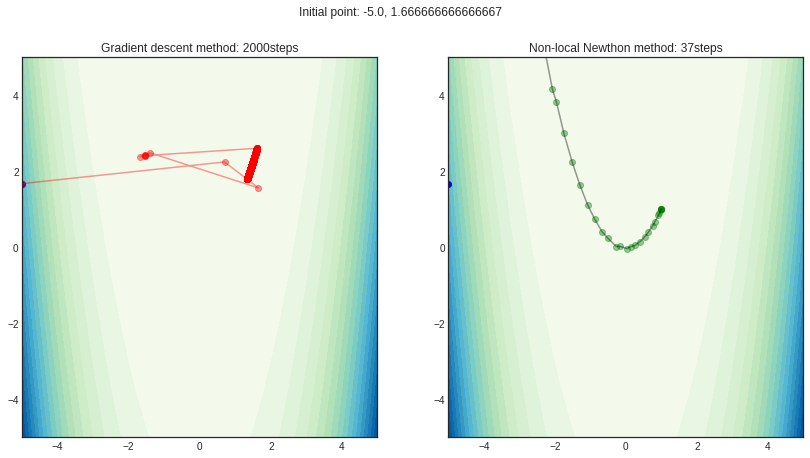

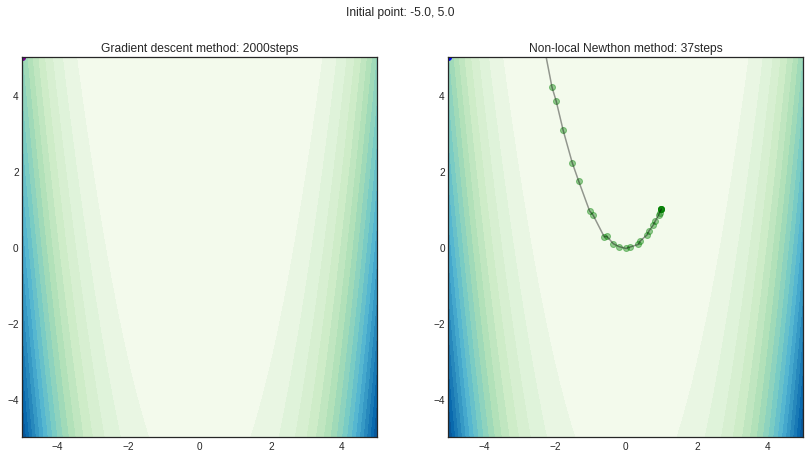

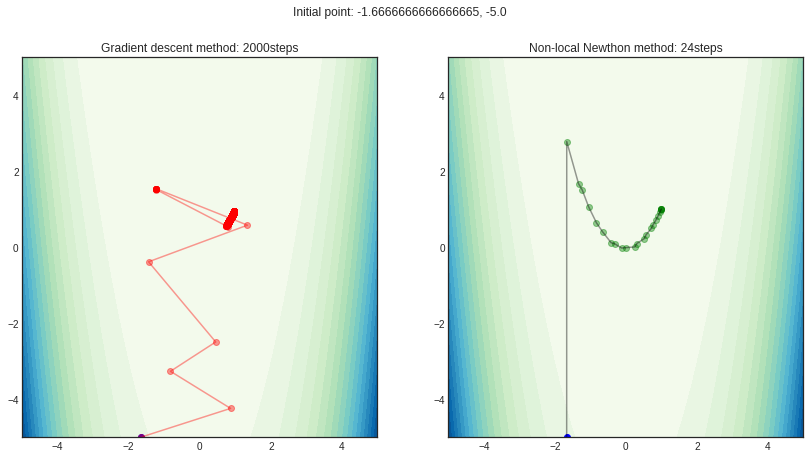

...

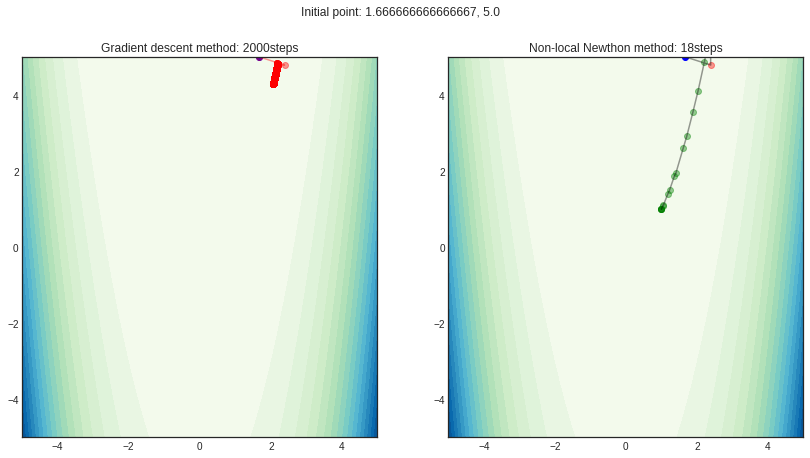

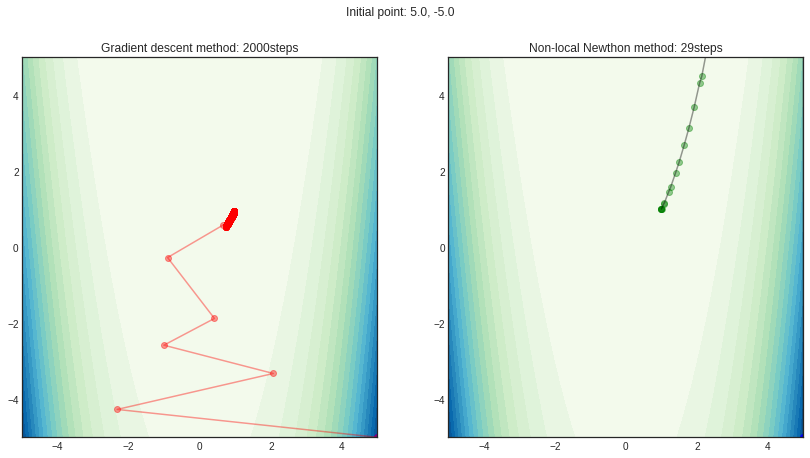

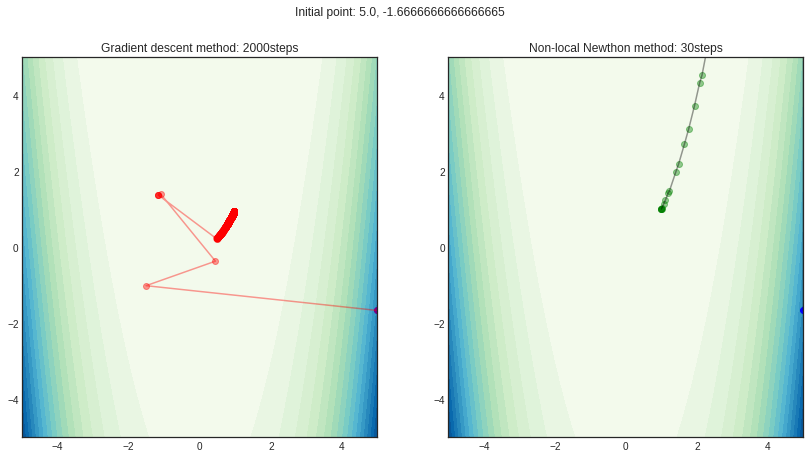

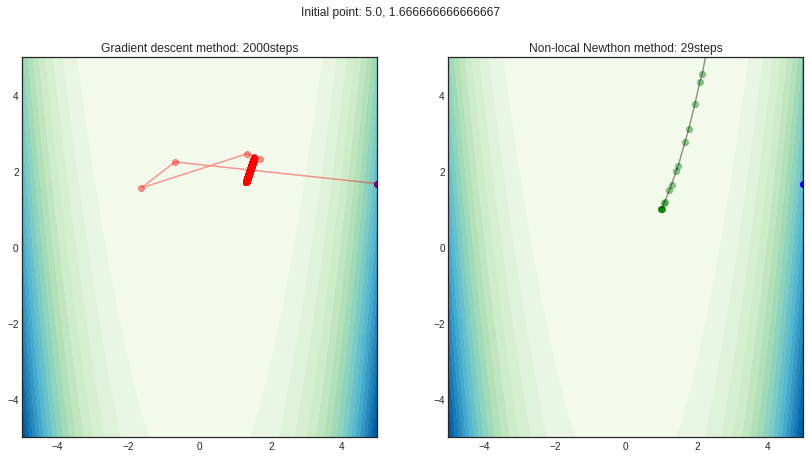

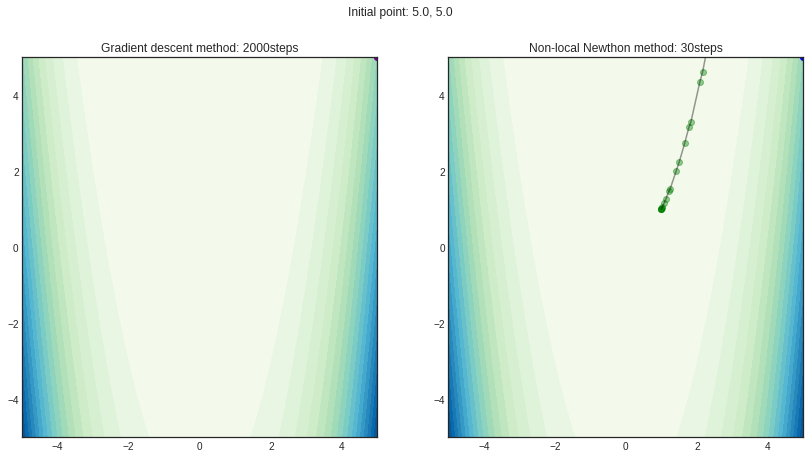

In [65]:
# Initializing an array to hold the number of steps ----------------------------
K = np.ones([2,N*N])

x1 = np.linspace(-xlim, xlim, 100)
x2 = np.linspace(-ylim, ylim, 100)

X1, X2 = np.meshgrid(x1, x2)
Z = f_aux(X1, X2, a, b)

# Initializing the plots -------------------------------------------------------
for i in range(0, N*N):
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))
  fig.suptitle('Initial point: ' + str(x_zeros[0,i]) + ", " + str(x_zeros[1,i]))
  ax1.contourf(X1, X2, Z, 20, cmap='GnBu')
  ax1.set_xlim([-xlim, xlim])
  ax1.set_ylim([-ylim, ylim])
  ax1.scatter(x_zeros[0,[i]], x_zeros[1,[i]], c='b')  

  ax2.contourf(X1, X2, Z, 20, cmap='GnBu')
  ax2.set_xlim([-xlim, xlim])
  ax2.set_ylim([-ylim, ylim])
  ax2.scatter(x_zeros[0,[i]], x_zeros[1,[i]], c='b')  

# Running the methods and plotting the behavious -------------------------------
  xk1, k1 = grad_des_improv(x_zeros[:,[i]], tol)      # GRADIENT DESCENT
  K[0,i] = k1       # Storing the number of steps
  ax1.plot(xk1[0], xk1[1], c='r', alpha=0.4)        # Plotting the path of the xk
  ax1.scatter(xk1[0], xk1[1], c='r', alpha=0.4)     # Scattering points at each step k
  ax1.set_title("Gradient descent method: " + str(k1) + "steps")

  xk2, k2, c = newton_gen(x_zeros[:,[i]], tol)      # NON-LOCAL NEWTHON METHOD
  K[1,i] = k2       # Storing the number of steps
  ax2.plot(xk2[0], xk2[1], c='k', alpha=0.4)        # Plotting the path of the xk
  for i in range(0, xk2.shape[1]):        # Scattering the points of each step with different colors
    if c[i]=="g":
      plt.scatter(xk2[0,[i]], xk2[1,[i]], c='g', alpha=0.4)     # Scattering points at each step k
    if c[i]=="r":
      plt.scatter(xk2[0,[i]], xk2[1,[i]], c='r', alpha=0.4)     # Scattering points at each step k
  ax2.set_title("Non-local Newthon method: " + str(k2) + "steps")

# Comparing the number of steps
print("Numer of steps for the different initial values with the Gradient descent method: ")
print(K[0])
print("Numer of steps for the different initial values with the non-local Newthon method: ")
print(K[1])

OBSERVATIONS: 
- As we were expecting the modified Newthon method performs considerably better, reaching the minimum in way less iterations
- If we consider a stop condition on the number of iterations, the gradient descent method does not even reach the minimum, while the Gradient-Newthon method has no issues doing so